In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import geopandas as gpd
from geopandas import GeoDataFrame as gdf
from shapely.geometry import Point
import seaborn as sns
import libpysal as lp
from libpysal.weights import Queen, KNN, attach_islands
from libpysal import weights
import mapclassify as mc
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from esda.moran import Moran, Moran_Local
from sklearn.cluster import KMeans, AgglomerativeClustering

#%matplotlib inline

In [2]:
import streamlit
print(streamlit.__version__)

AttributeError: partially initialized module 'streamlit' has no attribute 'cache' (most likely due to a circular import)

In [16]:
pip install sklearn

  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1321 sha256=1b9ac9f8fbb4ca443e23d4724b731b8f2ecba1226d507a1ce31c05e23c6147af
  Stored in directory: c:\users\gear\appdata\local\pip\cache\wheels\22\0b\40\fd3f795caaa1fb4c6cb738bc1f56100be1e57da95849bfc897
Successfully built sklearn
Note: you may need to restart the kernel to use updated packages.


In [2]:
final_df = gpd.read_file('capstone1/capstone1.shp')

In [3]:
final_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1647 entries, 0 to 1646
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Shape_Leng  1647 non-null   float64 
 1   Shape_Area  1647 non-null   float64 
 2   Municipali  1647 non-null   int64   
 3   RegCode     1647 non-null   int64   
 4   Region      1647 non-null   object  
 5   ProvinceCo  1647 non-null   int64   
 6   Province    1647 non-null   object  
 7   Municipa_1  1647 non-null   object  
 8   Mun_Povert  1647 non-null   float64 
 9   total_beds  1647 non-null   float64 
 10  beds_per_c  1647 non-null   float64 
 11  total_case  1647 non-null   float64 
 12  current_ca  1647 non-null   float64 
 13  total_inci  1647 non-null   float64 
 14  current_in  1647 non-null   float64 
 15  case_fatal  1647 non-null   float64 
 16  population  1647 non-null   float64 
 17  atrisk      1647 non-null   float64 
 18  elderly_po  1647 non-null   float64 
 19

In [6]:
pip freeze

alabaster==0.7.12
altair==4.1.0
anaconda-client==1.7.2
anaconda-navigator==1.10.0
anaconda-project==0.8.3
argh==0.26.2
argon2-cffi @ file:///C:/ci/argon2-cffi_1596828585465/work
asn1crypto @ file:///tmp/build/80754af9/asn1crypto_1596577642040/work
astor==0.8.1
astroid @ file:///C:/ci/astroid_1592487315634/work
astropy==4.0.2
async-generator==1.10
atomicwrites==1.4.0
attrs @ file:///tmp/build/80754af9/attrs_1604765588209/work
autopep8 @ file:///tmp/build/80754af9/autopep8_1596578164842/work
Babel @ file:///tmp/build/80754af9/babel_1605108370292/work
backcall==0.2.0
backports.functools-lru-cache==1.6.1
backports.shutil-get-terminal-size==1.0.0
backports.tempfile==1.0
backports.weakref==1.0.post1
base58==2.1.0
bcrypt @ file:///C:/ci/bcrypt_1597936263757/work
beautifulsoup4 @ file:///tmp/build/80754af9/beautifulsoup4_1601924105527/work
bitarray @ file:///C:/ci/bitarray_1605065210072/work
bkcharts==0.2
bleach @ file:///tmp/build/80754af9/bleach_1600439572647/work
blinker==1.4
blis==0.7.4
bo

In [90]:
final_df = final_df.rename(columns = {'Municipali':'municipalcode',
                                     'Municipa_1':'municipality',
                                     'Mun_Povert':'Mun_Poverty_Incidence',
                                     'beds_per_c': 'beds_per_capita',
                                     'current_ca': 'current_cases',
                                     'total_inci': 'total_incidence',
                                     'current_in': 'current_incidence',
                                     'case_fatal': 'case_fatality_rate',
                                     'population': 'population_density',
                                     'elderly_po': 'elderly_poor',
                                     'total_case': 'total_cases'})
final_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1647 entries, 0 to 1646
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Shape_Leng             1647 non-null   float64 
 1   Shape_Area             1647 non-null   float64 
 2   municipalcode          1647 non-null   int64   
 3   RegCode                1647 non-null   int64   
 4   Region                 1647 non-null   object  
 5   ProvinceCo             1647 non-null   int64   
 6   Province               1647 non-null   object  
 7   municipality           1647 non-null   object  
 8   Mun_Poverty_Incidence  1647 non-null   float64 
 9   total_beds             1647 non-null   float64 
 10  beds_per_capita        1647 non-null   float64 
 11  total_cases            1647 non-null   float64 
 12  current_cases          1647 non-null   float64 
 13  total_incidence        1647 non-null   float64 
 14  current_incidence      1647 non-

In [91]:
final_df.at[94, 'population_density']=1.27
final_df.at[461,'Mun_Poverty_Incidence'] = 48.7
final_df.at[691,'Mun_Poverty_Incidence'] = 50.4

## EDA

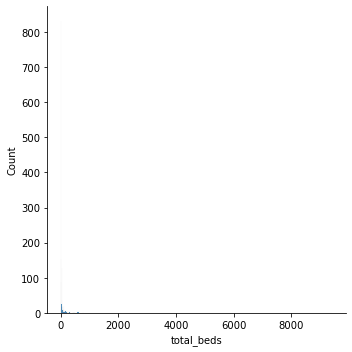

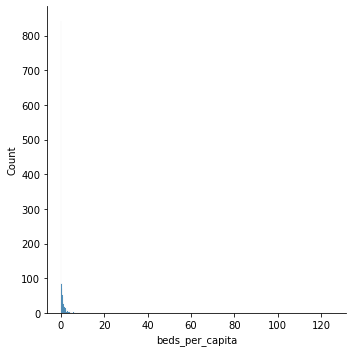

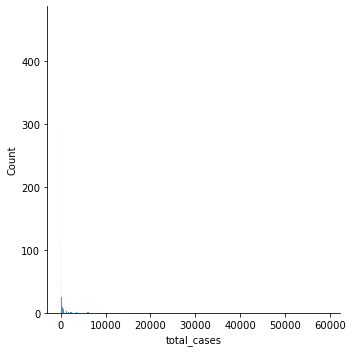

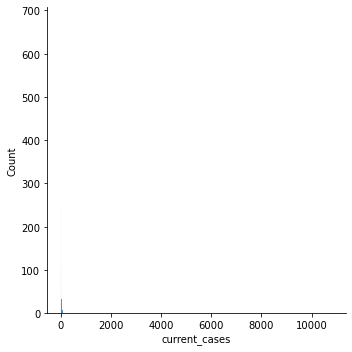

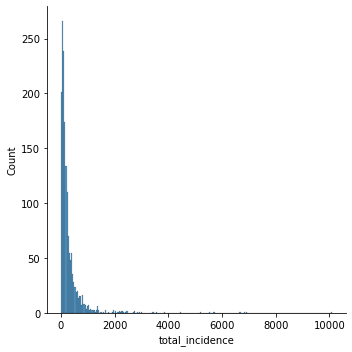

...

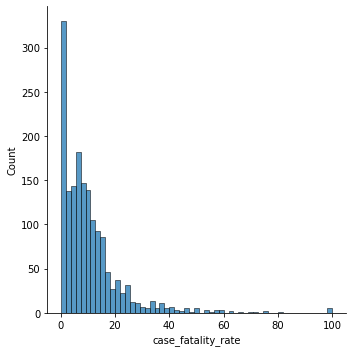

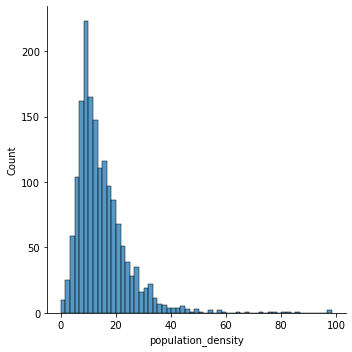

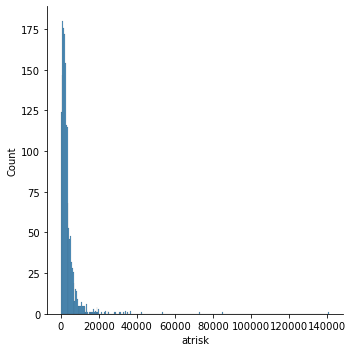

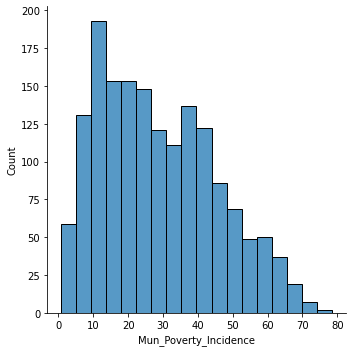

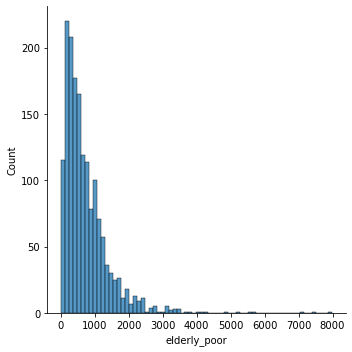

In [92]:
columns = ['total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor']
for column in columns:
    sns.displot(final_df[column])
    #plt.title(column)

### Infirmary and Hospitals

In [93]:
final_df[['total_beds','beds_per_capita']].describe()

,total_beds,beds_per_capita
count,1647.000000,1647.000000
mean,70.573770,0.742619
std,327.253324,4.144936
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,28.000000,0.694717
max,9414.000000,124.948903


In [94]:
# percent of municipalities that have 0 beds
final_df[final_df['total_beds']==0]['total_beds'].count()/final_df['total_beds'].count()*100

50.394656952034

In [329]:
# percent of municipalities that have  less than 1 bed per 1000 population
final_df[final_df['beds_per_capita']<1]['beds_per_capita'].mean()

0.1834350272503373

In [96]:
final_df[final_df['beds_per_capita']==1]['beds_per_capita'].count()/final_df['beds_per_capita'].count()*100

0.0

In [328]:
final_df[final_df['beds_per_capita']>0]['beds_per_capita'].min()

0.065850992374455

In [97]:
final_df[final_df['beds_per_capita']>1]['beds_per_capita'].mean()

3.243156963896971

In [98]:
# percent of municipalities with adjacent neighbors that has more than an average of 1 bed per 1000 population
#final_df[final_df['beds_per_capita_lag']>1]['beds_per_capita_lag'].count()/final_df['beds_per_capita_lag'].count()*100

### Covid

In [288]:
final_df[['total_cases','total_incidence','current_cases','current_incidence','case_fatality_rate']].describe()

,total_cases,total_incidence,current_cases,current_incidence,case_fatality_rate
count,1647.000000,1647.000000,1647.000000,1647.000000,1647.000000
mean,413.937462,307.401517,60.109897,43.008867,10.314928
std,2215.007815,589.446446,384.188687,129.642027,11.755351
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,74.152213,1.000000,3.193307,2.857143
50%,50.000000,155.408206,4.000000,11.666229,7.692308
75%,144.500000,322.769563,16.000000,31.408836,13.704850
max,59328.000000,10096.743426,10818.000000,2227.823954,100.000000


In [100]:
# municipalities that have no recorded covid cases
final_df[final_df['total_incidence']==0]['total_incidence'].count()

18

In [101]:
# percent municipalities that currently have COVID 19 cases
final_df[final_df['current_incidence']>0]['current_incidence'].count()/final_df['current_incidence'].count()*100

81.11718275652701

In [102]:
#minimum current incidence for municipalities that have COVID-19 cases 
final_df[final_df['current_incidence']>0]['current_incidence'].min()

0.703279391803982

In [103]:
# percent municipalities that currently have no COVID 19 deaths
final_df[final_df['case_fatality_rate']==0]['case_fatality_rate'].count()/final_df['case_fatality_rate'].count()*100

17.60777170613236

In [104]:
# percent municipalities that currently have greater than 2.2% (2.1M/128M)
final_df[final_df['case_fatality_rate']>0.22]['case_fatality_rate'].count()/final_df['case_fatality_rate'].count()*100

82.39222829386765

### Others

In [105]:
final_df[['population_density','atrisk','Mun_Poverty_Incidence','elderly_poor']].describe()

,population_density,atrisk,Mun_Poverty_Incidence,elderly_poor
count,1647.000000,1647.000000,1647.000000,1647.000000
mean,14.951348,3593.027930,28.640498,733.066992
std,9.824220,6100.635072,16.603806,709.558336
min,0.030000,0.000000,0.700000,0.000000
25%,8.745000,1248.000000,14.500000,278.580500
50%,12.610000,2307.000000,26.400000,542.334000
75%,18.635000,3897.000000,40.500000,974.337500
max,98.480000,141040.000000,78.500000,7985.600000


## Visualize the data using geopandas

Health Facility data

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


<AxesSubplot:>

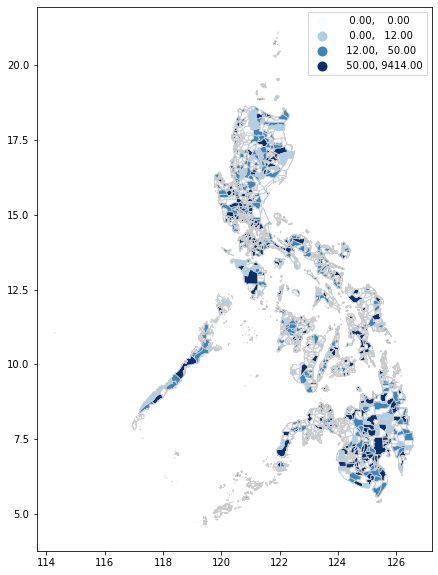

In [106]:
variable = 'total_beds'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


<AxesSubplot:>

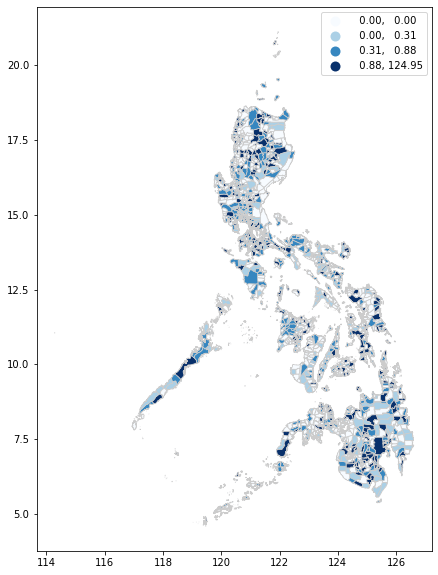

In [107]:
variable = 'beds_per_capita'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

COVID Data

<AxesSubplot:>

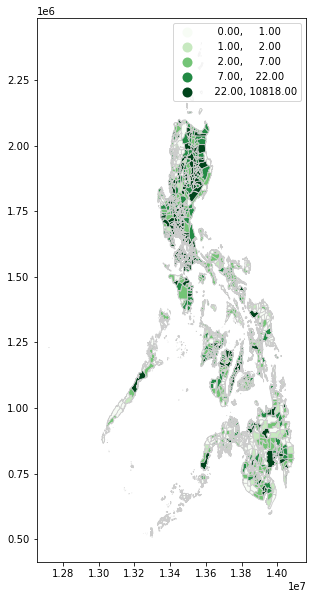

In [289]:
variable = 'current_cases'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

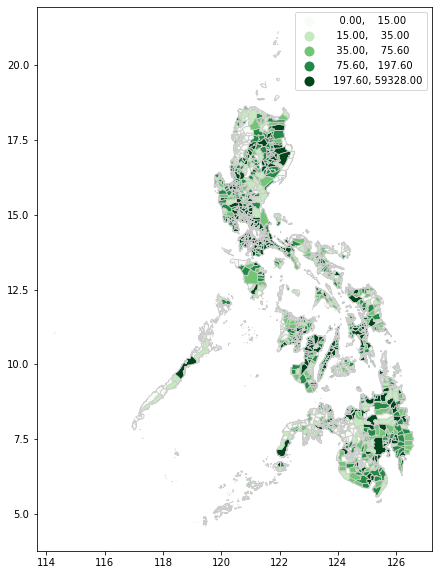

In [109]:
variable = 'total_cases'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

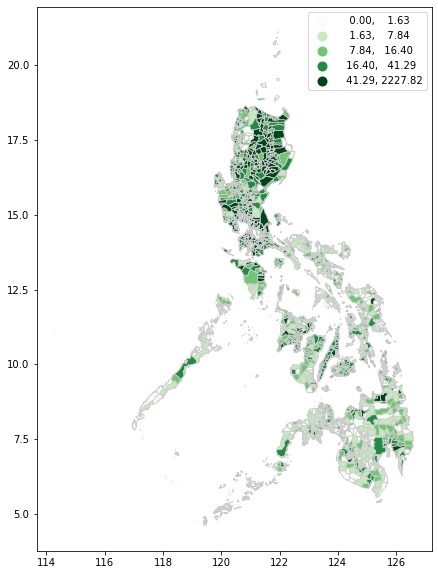

In [110]:
variable = 'current_incidence'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

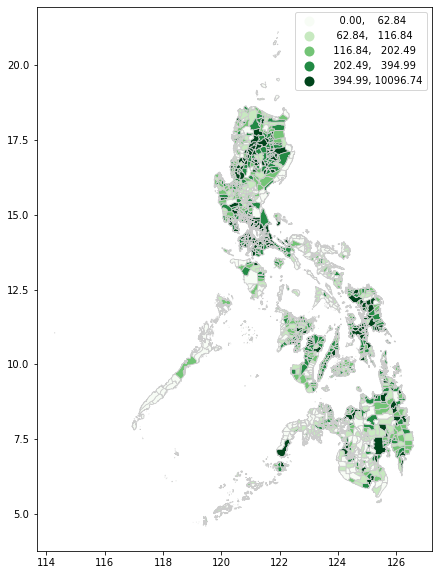

In [111]:
variable = 'total_incidence'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

<AxesSubplot:>

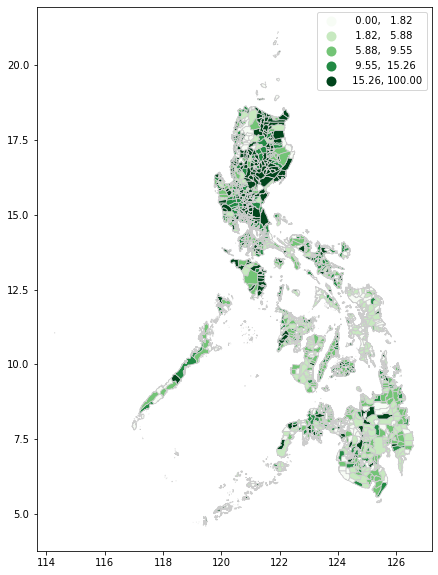

In [112]:
variable = 'case_fatality_rate'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Greens', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

In [113]:
final_df['case_fatality_rate'].mean()

10.31492777237547

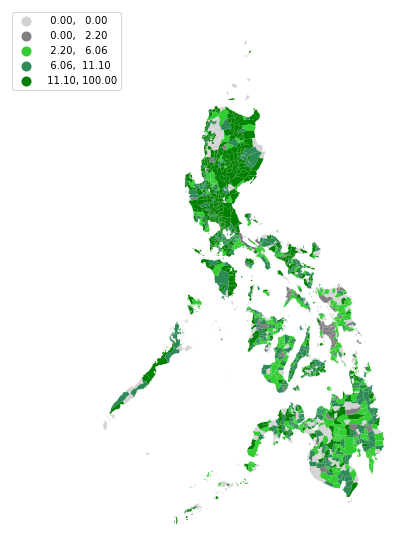

In [114]:
variable = 'case_fatality_rate'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
hmap = ListedColormap([ 'lightgrey', 'grey', 'limegreen', 'seagreen', 'g'])
final_df.plot(column=variable, cmap=hmap, linewidth=0, ax=ax, edgecolor='0.2', legend_kwds = {'loc' : 'upper left'}, scheme = 'User_defined', 
              legend=True, classification_kwds = dict(bins=[0.0, 2.2, 6.06, 11.1]))
#df.plot(column='cluster_labels', categorical = True, cmap=hmap, linewidth=0, ax=ax, edgecolor='0.1', legend = True, alpha = 1)
#regions.boundary.plot(ax=ax, linewidth = 1, edgecolor='0.2')
ax.set_axis_off()
#sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

Population Data

<AxesSubplot:>

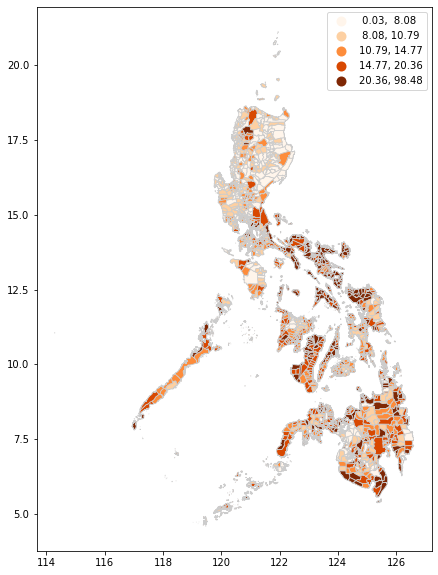

In [115]:
variable = 'population_density'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Oranges', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

In [116]:
final_df[final_df['population_density']==0]

,Shape_Leng,Shape_Area,municipalcode,RegCode,Region,ProvinceCo,Province,municipality,Mun_Poverty_Incidence,total_beds,...,total_cases,current_cases,total_incidence,current_incidence,case_fatality_rate,population_density,atrisk,elderly_poor,elderly__1,geometry


<AxesSubplot:xlabel='population_density', ylabel='Region'>

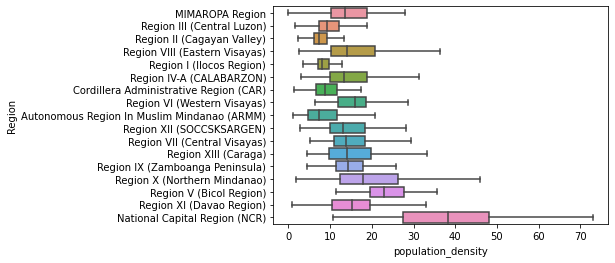

In [185]:
sns.boxplot(x='population_density', y='Region', data = final_df, showfliers = False)

<AxesSubplot:>

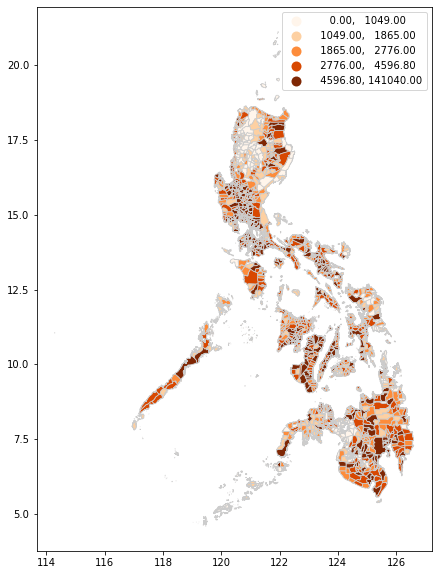

In [117]:
variable = 'atrisk'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Oranges', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

In [118]:
final_df[final_df['atrisk']==0]

,Shape_Leng,Shape_Area,municipalcode,RegCode,Region,ProvinceCo,Province,municipality,Mun_Poverty_Incidence,total_beds,...,total_cases,current_cases,total_incidence,current_incidence,case_fatality_rate,population_density,atrisk,elderly_poor,elderly__1,geometry
691,0.031076,0.000033,175321000,170000000,MIMAROPA Region,175300000,Palawan,Kalayaan,50.4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.03,0.0,0.0,0.0,"POLYGON ((114.28840 11.05374, 114.28855 11.053..."


<AxesSubplot:>

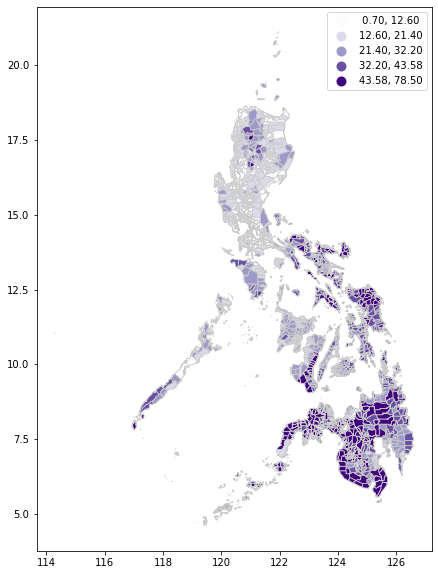

In [119]:
variable = 'Mun_Poverty_Incidence'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Purples', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

In [120]:
final_df[final_df['Mun_Poverty_Incidence']==0]

,Shape_Leng,Shape_Area,municipalcode,RegCode,Region,ProvinceCo,Province,municipality,Mun_Poverty_Incidence,total_beds,...,total_cases,current_cases,total_incidence,current_incidence,case_fatality_rate,population_density,atrisk,elderly_poor,elderly__1,geometry


<AxesSubplot:xlabel='Mun_Poverty_Incidence', ylabel='Region'>

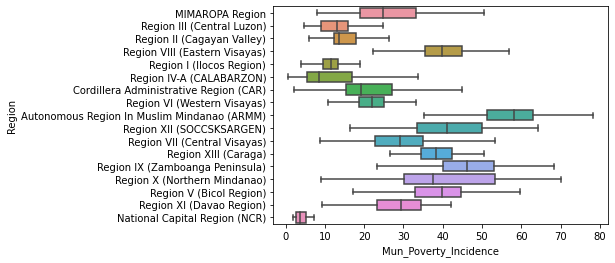

In [184]:
sns.boxplot(x='Mun_Poverty_Incidence', y='Region', data = final_df, showfliers = False)

In [321]:
final_df[['municipality', 'Mun_Poverty_Incidence', 'current_incidence']].sort_values(by = 'Mun_Poverty_Incidence')[0:5]

,municipality,Mun_Poverty_Incidence,current_incidence
289,Cainta,0.7,258.061804
398,City of Makati,1.9,1067.654742
813,Los Baños,2.1,147.408686
725,La Trinidad (Capital),2.1,151.126117
402,City of Mandaluyong,2.4,595.712454


In [322]:
final_df[['municipality', 'Mun_Poverty_Incidence', 'current_incidence']].sort_values(by = 'Mun_Poverty_Incidence', ascending = False)[0:5]

,municipality,Mun_Poverty_Incidence,current_incidence
1457,Silvino Lobos,78.5,0.000000
1519,Tagoloan Ii,78.2,0.000000
696,Kapai,73.6,0.000000
1057,Pagayawan,73.2,0.000000
944,Marogong,72.5,7.525587


<AxesSubplot:>

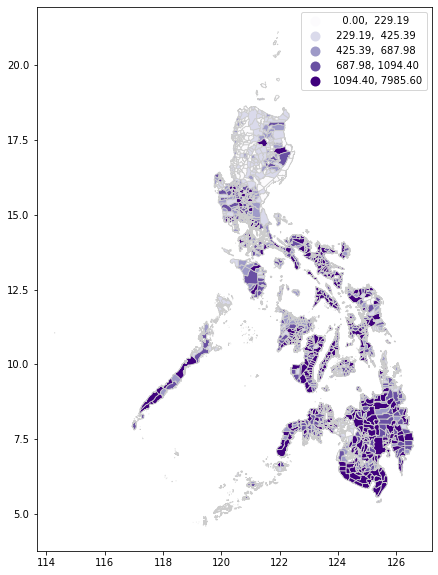

In [121]:
variable = 'elderly_poor'
#vmin, vmax = final_df[variable].min(), final_df[variable].max()
fig, ax = plt.subplots(1, figsize=(15, 10))
final_df.plot(column=variable, cmap='Purples', linewidth=0.8, ax=ax, edgecolor='0.8', scheme = 'Quantiles', k=5, legend=True)
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#cbar = fig.colorbar(sm)

Outliers

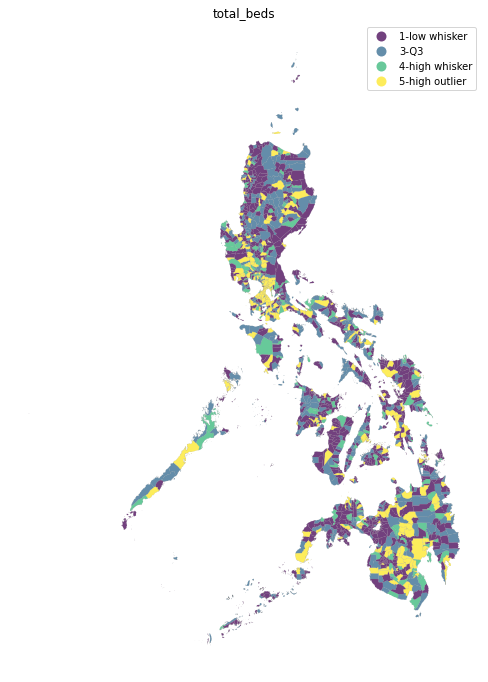

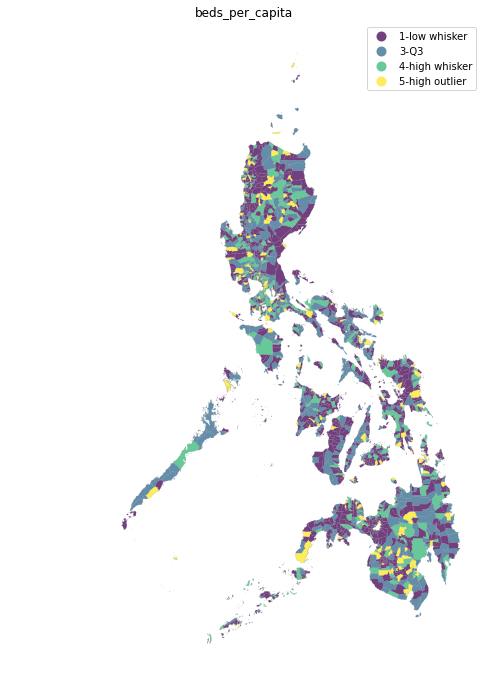

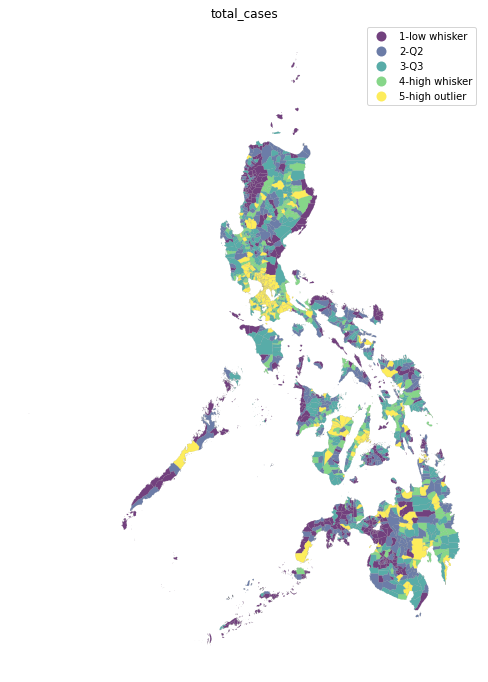

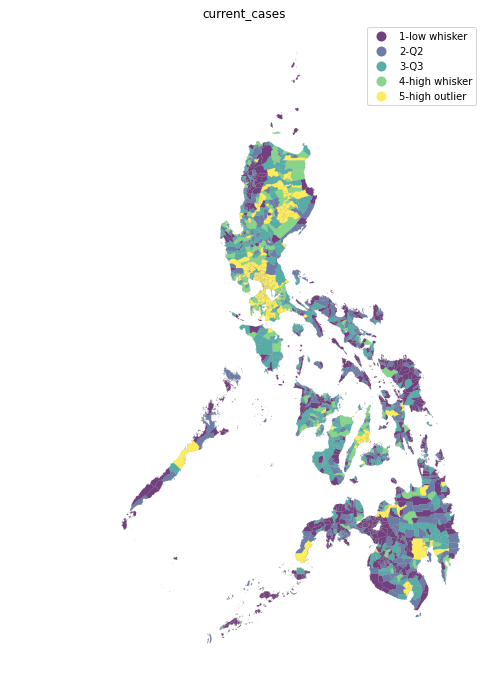

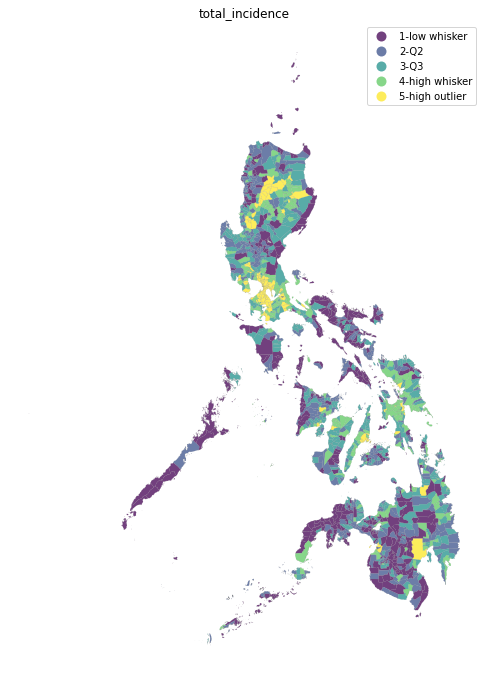

...

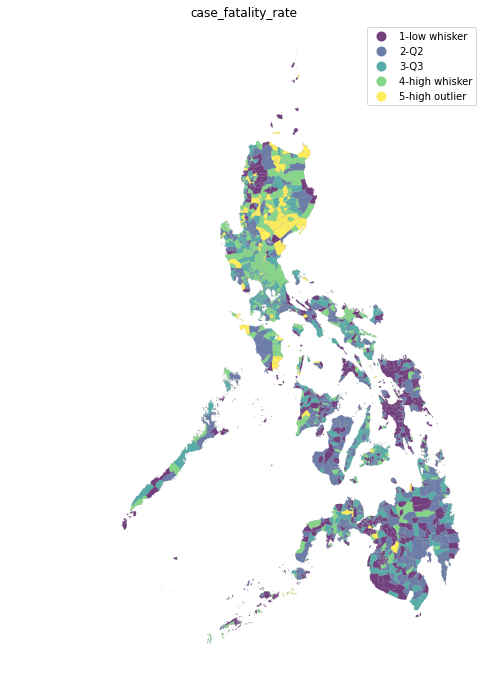

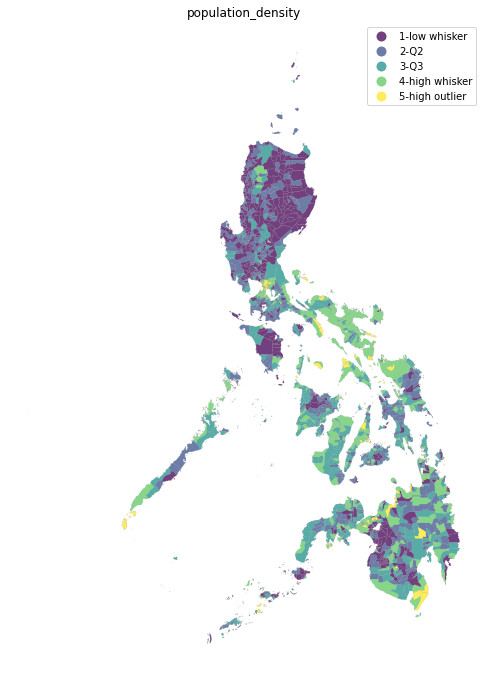

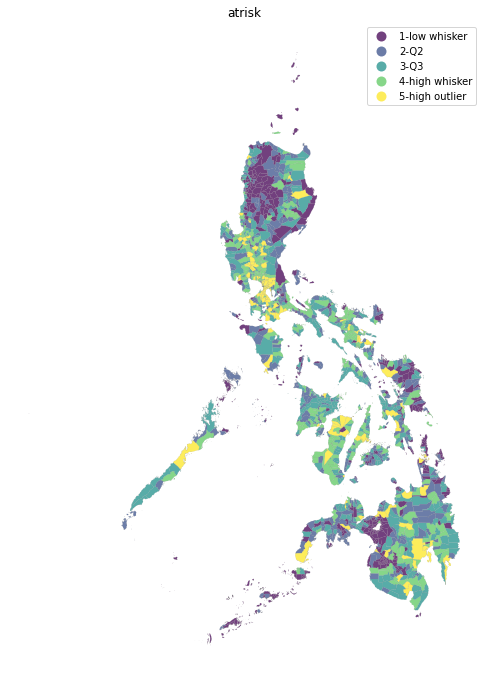

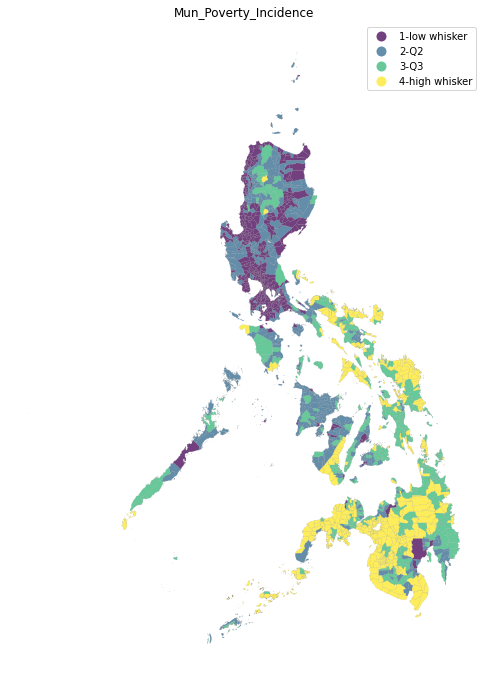

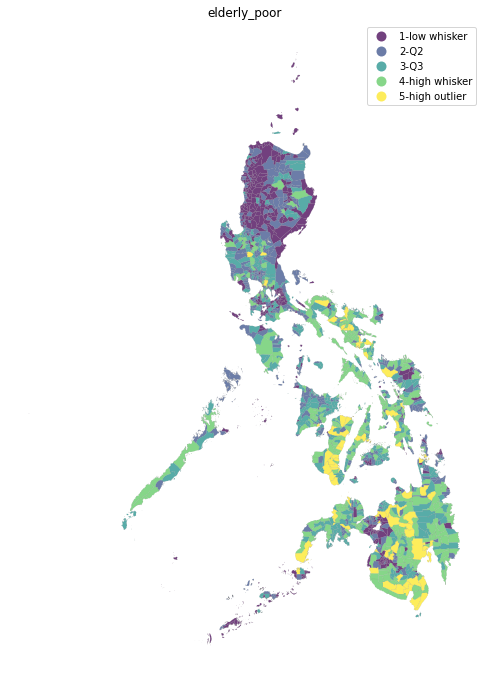

In [122]:
columns = ['total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor']
labels = ['0-low outlier', '1-low whisker',
          '2-Q2', '3-Q3', '4-high whisker', '5-high outlier']
for column in columns:
    y = final_df[column]
    bp = mc.BoxPlot(y)
    bpl = [ labels[b] for b in bp.yb ]
    f, ax = plt.subplots(1, figsize=(12, 12))
    final_df.assign(cl=bpl).plot(column='cl', categorical=True, \
                                      k=4, cmap='viridis', linewidth=0.1, ax=ax,\
                                      edgecolor='grey', legend=True, alpha=0.75)
    ax.set_axis_off()
    plt.title(column)
    plt.show()

Check the correlation of the different features

In [123]:
features = final_df[[
           'beds_per_capita',
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence'
                    ]]

<AxesSubplot:>

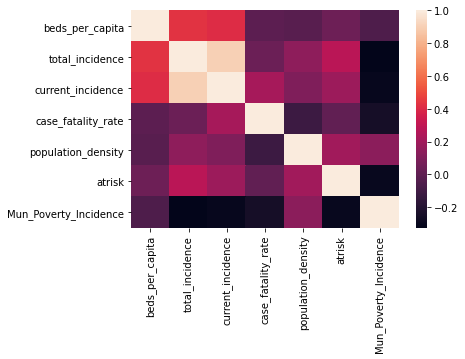

In [124]:
sns.heatmap(features.corr())

In [125]:
standard = pd.DataFrame(stdScaler(final_df[['case_fatality_rate', 'current_incidence', 'total_incidence',
                                           'population_density', 'atrisk', 'Mun_Poverty_Incidence']]))

In [126]:
standard

,0,1,2,3,4,5
0,1.148302,-0.261451,-0.456635,-0.304580,-0.171678,-0.424158
1,-0.310443,-0.315897,-0.469032,0.107792,-0.282356,0.371082
2,-0.168621,0.100156,0.678525,-0.672150,-0.188567,-0.851901
3,0.232182,-0.204586,-0.414370,-0.819790,-0.166267,-0.857925
4,-0.658294,-0.058165,0.478706,0.155648,0.160519,0.449401
...,...,...,...,...,...,...
1642,-0.407460,-0.202485,0.338653,0.104738,6.368151,-0.683213
1643,-0.735911,-0.231389,-0.079754,-0.528584,-0.206603,0.678334
1644,1.249604,-0.154757,-0.389836,-0.131485,-0.054606,-0.930220
1645,-0.591705,-0.068274,0.105474,0.906062,-0.253006,-0.677189


[Text(0, 0.5, 'Case Fatality Ratio')]

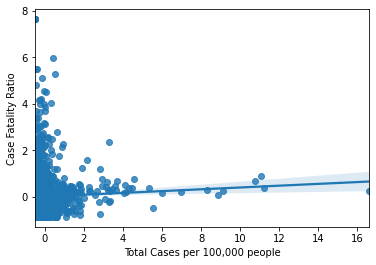

In [127]:
ax = sns.regplot(x=standard[2], y=standard[0], data=standard)
ax.set(xlabel='Total Cases per 100,000 people')
ax.set(ylabel='Case Fatality Ratio')

[Text(0, 0.5, 'Case Fatality Ratio')]

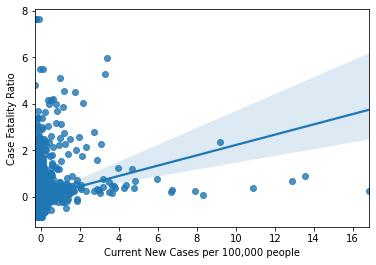

In [128]:
ax = sns.regplot(x=standard[1], y=standard[0], data=standard)
ax.set(xlabel='Current New Cases per 100,000 people')
ax.set(ylabel='Case Fatality Ratio')

[Text(0, 0.5, 'Current New Cases per 100,000 people')]

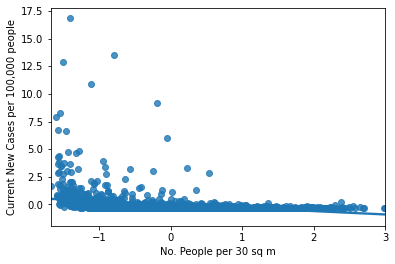

In [129]:
ax = sns.regplot(x=standard[5], y=standard[1], data=standard)
ax.set(xlabel='No. People per 30 sq m')
ax.set(ylabel='Current New Cases per 100,000 people')

[Text(0, 0.5, 'Current New Cases per 100,000 people')]

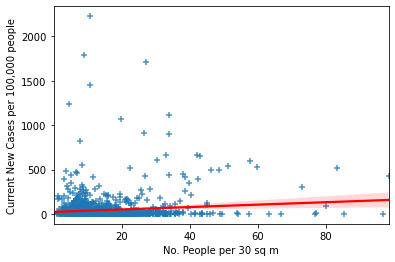

In [130]:
ax = sns.regplot(x='population_density', y='current_incidence', data=final_df,  marker = '+', line_kws={"color": "red"})
ax.set(xlabel='No. People per 30 sq m')
ax.set(ylabel='Current New Cases per 100,000 people')

[Text(0, 0.5, 'Current New Cases per 100,000 people')]

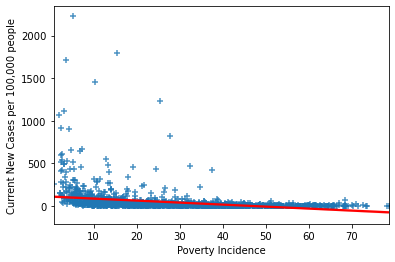

In [131]:
ax = sns.regplot(x='Mun_Poverty_Incidence', y='current_incidence', data=final_df, marker = '+', line_kws={"color": "red"})
ax.set(xlabel='Poverty Incidence')
ax.set(ylabel='Current New Cases per 100,000 people')

## Spatial Analysis of the Municipalities

In [132]:
def get_weights(df):
    wq = Queen.from_dataframe(df)
    wknn1 = KNN.from_dataframe(df)
    wfixed = weights.util.attach_islands(wq, wknn1)
    return wknn1


In [133]:
wfixed = get_weights(final_df)

C:\Users\gear\anaconda3\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 83 disconnected components.
 There are 46 islands with ids: 13, 44, 115, 159, 213, 285, 303, 311, 329, 451, 454, 486, 610, 611, 652, 654, 672, 691, 793, 796, 928, 942, 1091, 1111, 1114, 1134, 1169, 1201, 1213, 1229, 1259, 1306, 1363, 1413, 1427, 1449, 1458, 1470, 1471, 1480, 1505, 1511, 1570, 1581, 1610, 1646.
  warnings.warn(message)
C:\Users\gear\anaconda3\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 31 disconnected components.
  warnings.warn(message)
C:\Users\gear\anaconda3\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 44 disconnected components.
  warnings.warn(message)


In [134]:
final_df['geometry'] = final_df['geometry'].to_crs(epsg=3395)

In [135]:
spatial_ana = final_df

In [136]:
wq = Queen.from_dataframe(spatial_ana)

In [137]:
wq.islands

[13,
 44,
 115,
 159,
 213,
 285,
 303,
 311,
 329,
 451,
 454,
 486,
 610,
 611,
 652,
 654,
 672,
 691,
 793,
 796,
 928,
 942,
 1091,
 1111,
 1114,
 1134,
 1169,
 1201,
 1213,
 1229,
 1259,
 1306,
 1363,
 1413,
 1427,
 1449,
 1458,
 1470,
 1471,
 1480,
 1505,
 1511,
 1570,
 1581,
 1610,
 1646]

In [138]:
wknn1 = KNN.from_dataframe(spatial_ana)
wfixed = weights.util.attach_islands(wq, wknn1)

C:\Users\gear\anaconda3\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 29 disconnected components.
  warnings.warn(message)


In [139]:
wfixed.islands

[]

In [140]:
wfixed.transform = 'R'

(<Figure size 864x864 with 1 Axes>, <AxesSubplot:>)

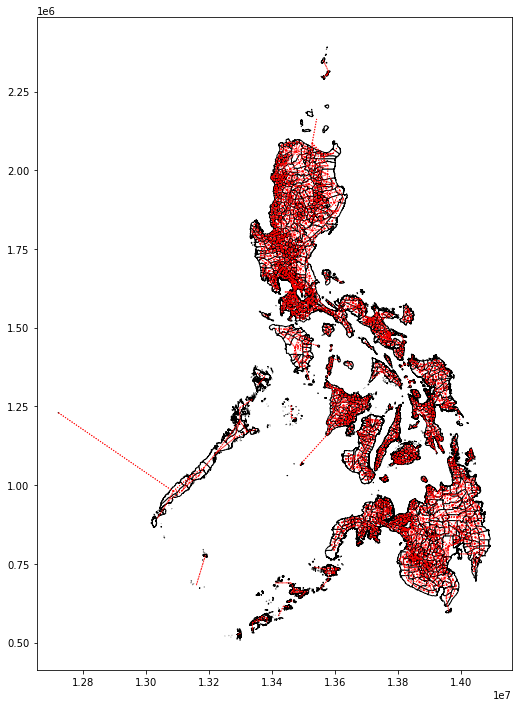

In [141]:
ax = final_df.plot(edgecolor='k', facecolor='w', figsize=(12, 12))
wfixed.plot(spatial_ana, ax=ax, 
        edge_kws=dict(color='r', linestyle=':', linewidth=1),
        node_kws=dict(marker=''))
#ax.set_axis_off()

### Spatial Lag

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


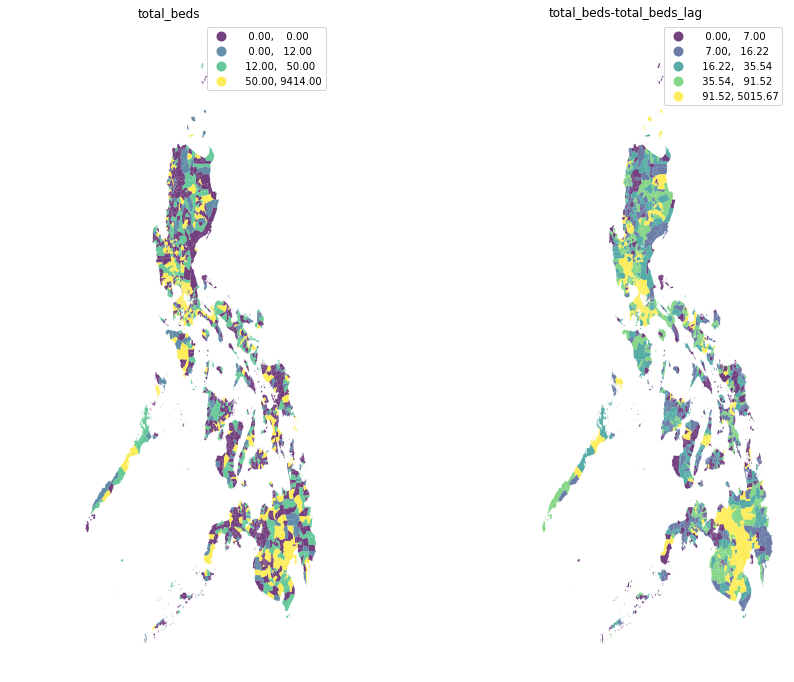

C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\gear\anaconda3\lib\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


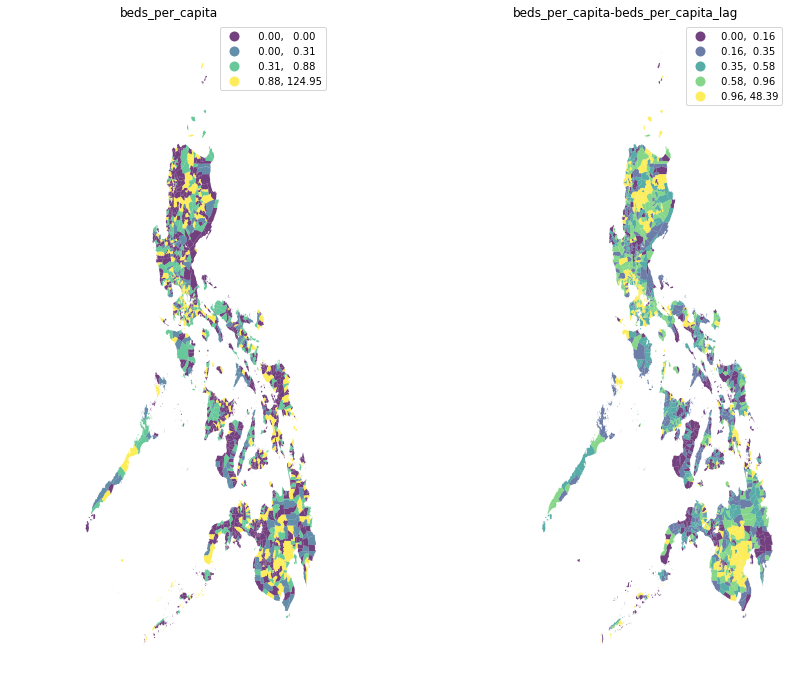

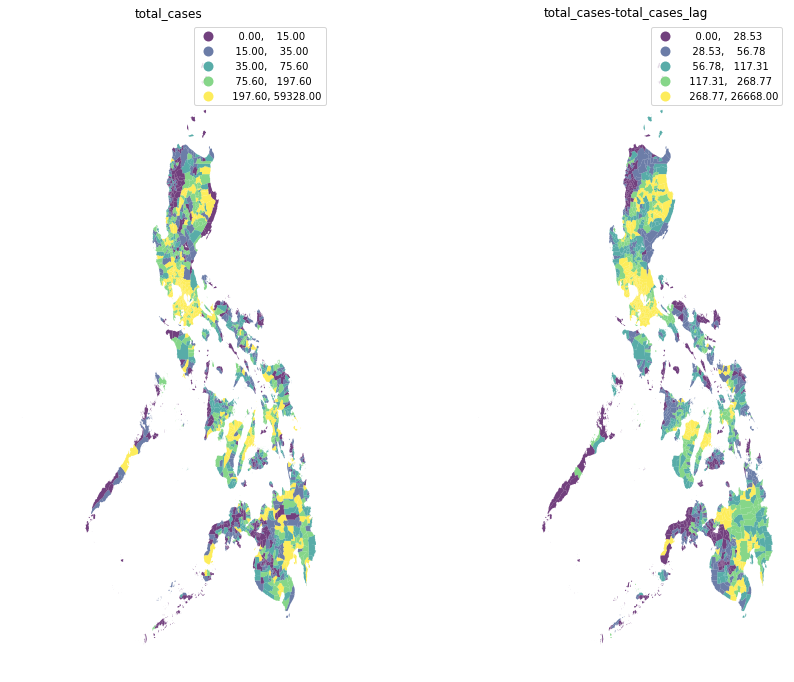

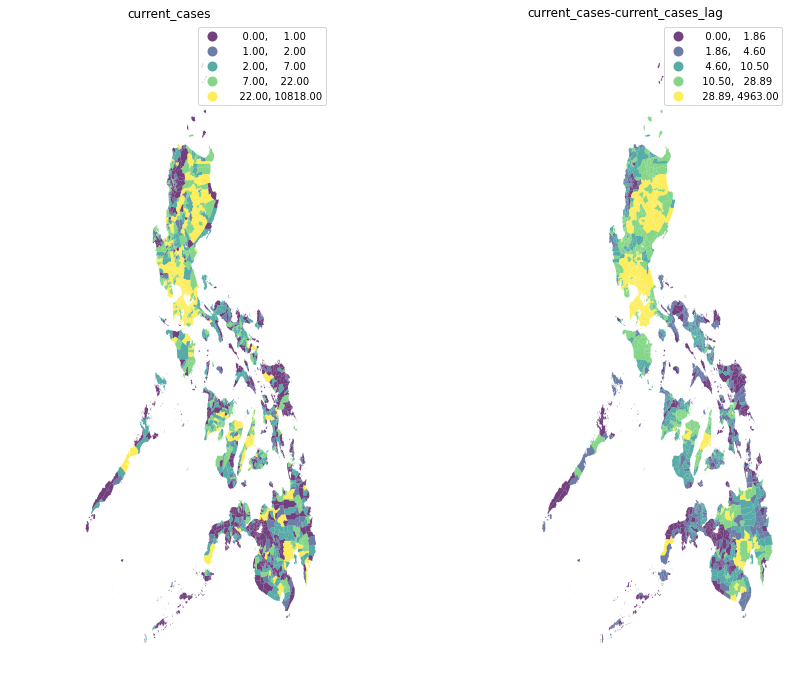

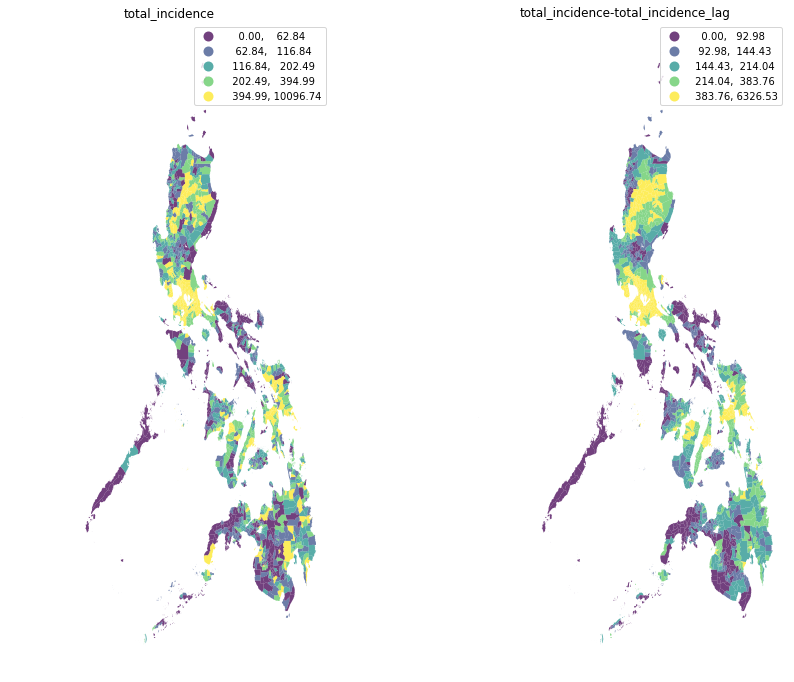

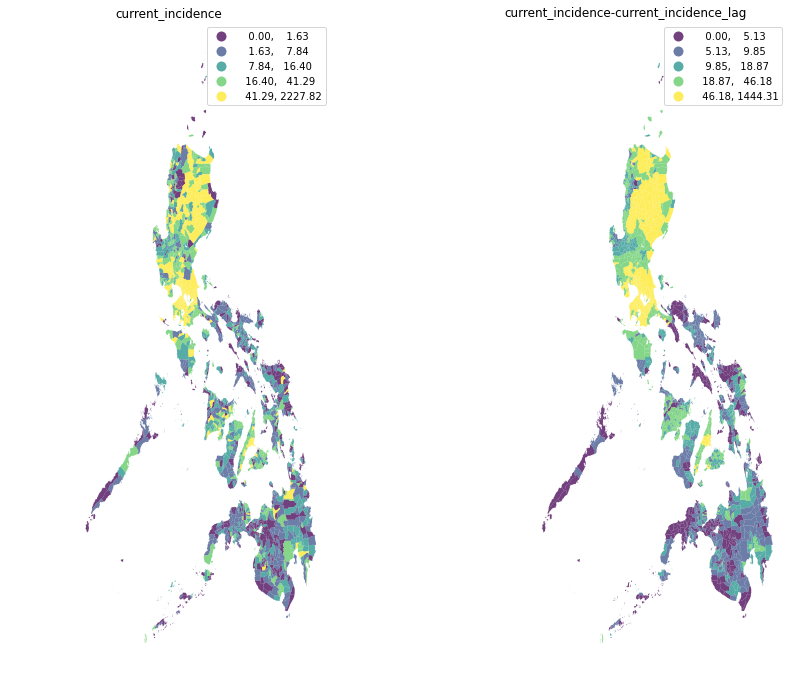

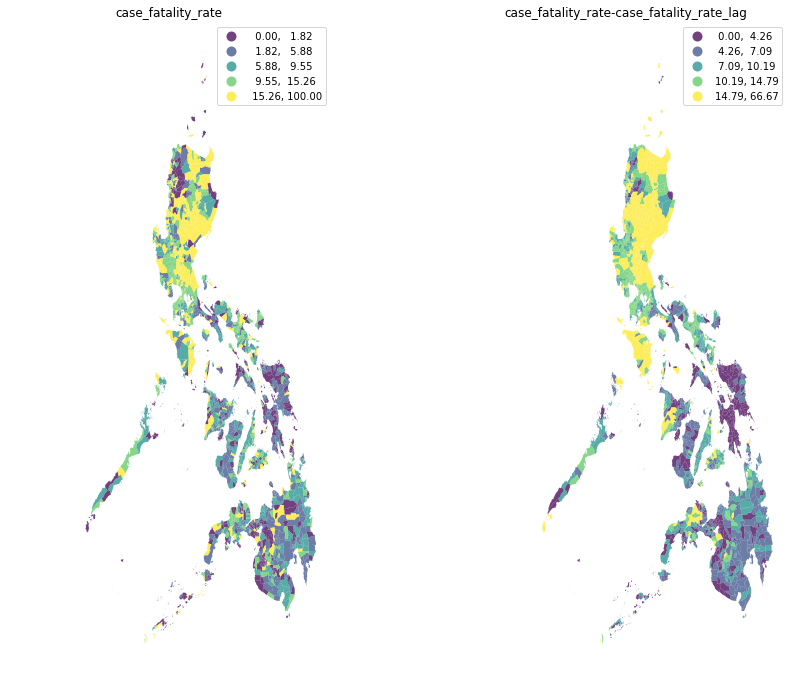

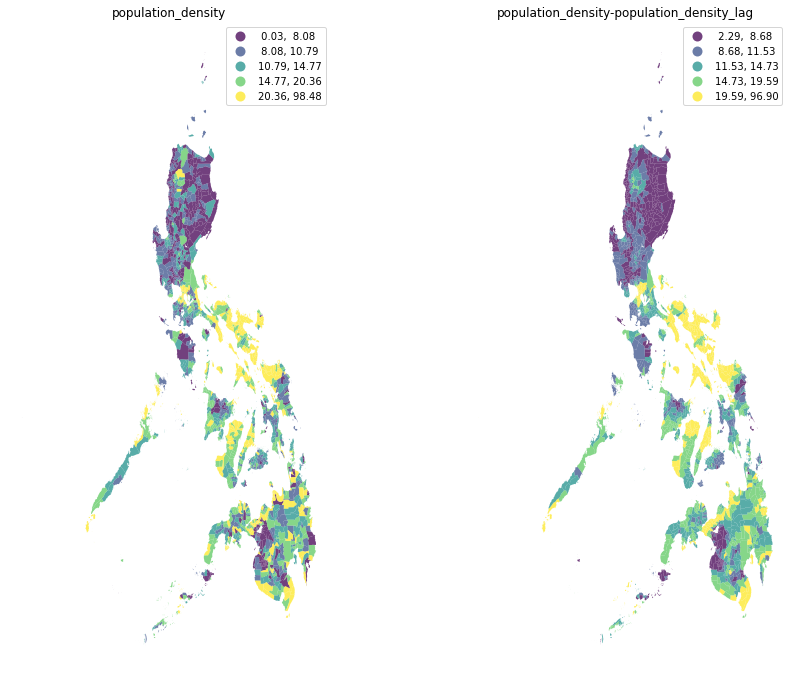

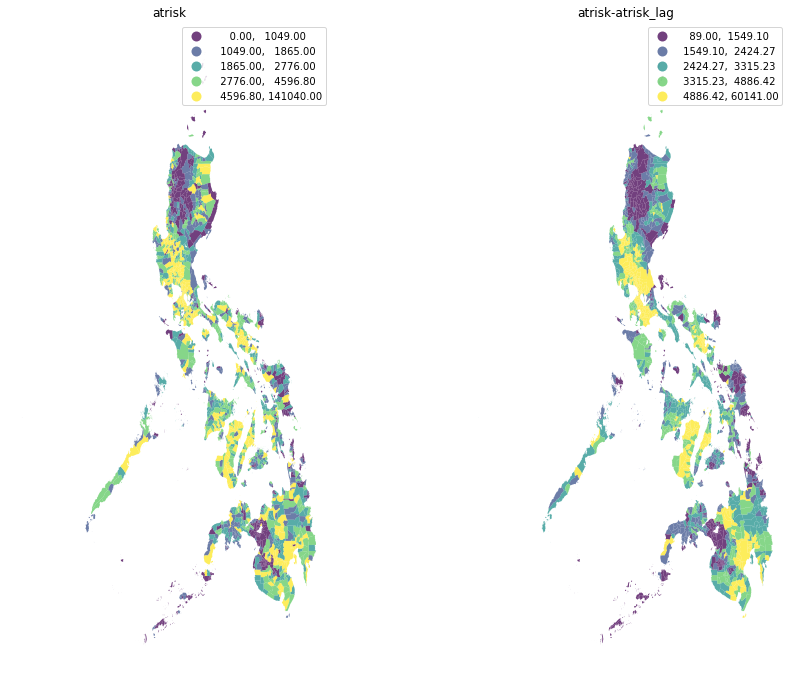

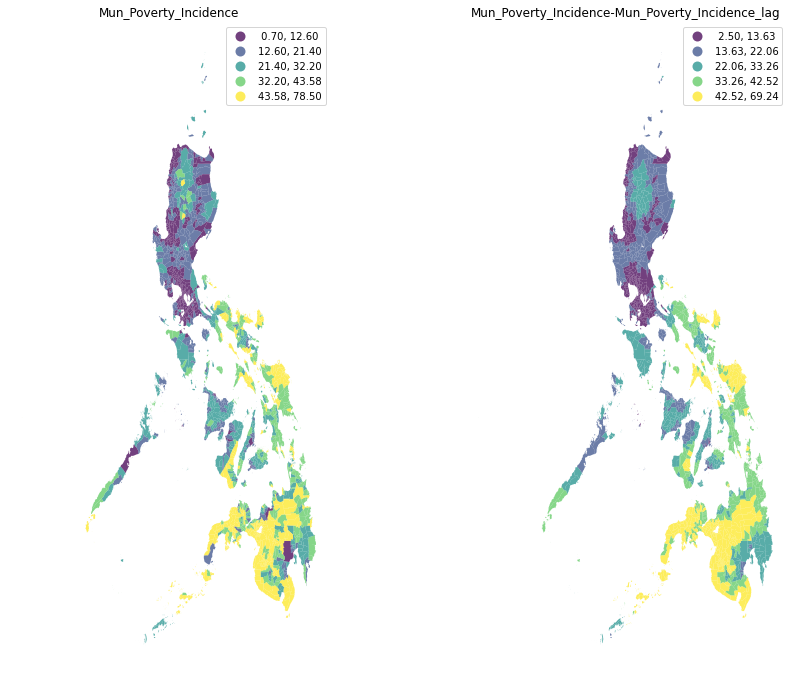

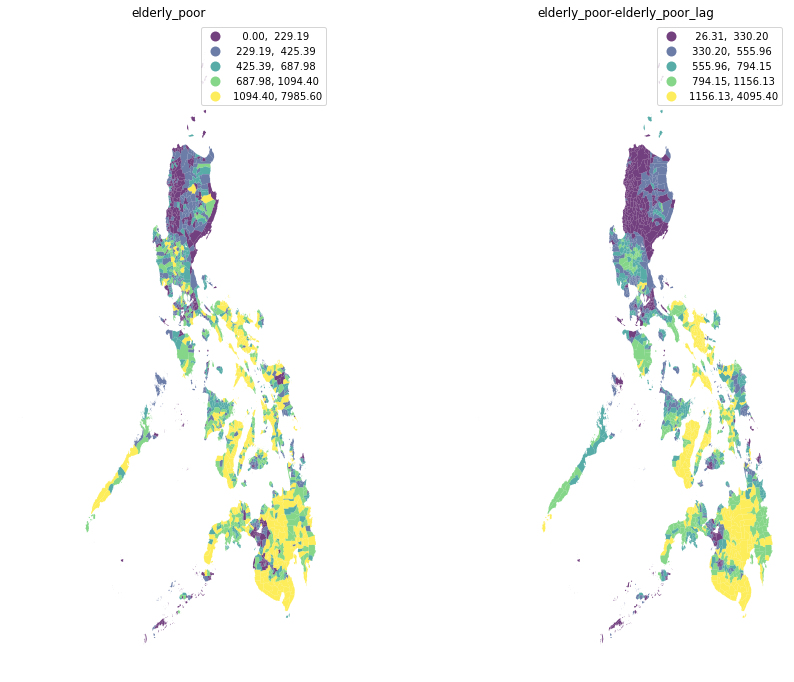

In [142]:
cluster_variables =  ['total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor'
]
lag_variables =  ['total_beds_lag', 
           'beds_per_capita_lag',
           'total_cases_lag',
           'current_cases_lag', 
           'total_incidence_lag',
           'current_incidence_lag',
           'case_fatality_rate_lag',
           'population_density_lag',
           'atrisk_lag', 
           'Mun_Poverty_Incidence_lag',
           'elderly_poor_lag'
]

for i in range(len(cluster_variables)):
    spatial_ana[lag_variables[i]] = weights.lag_spatial(wfixed, spatial_ana[cluster_variables[i]])
    f, axs = plt.subplots(1, 2, figsize=(15, 12))
    ax1, ax2 = axs

    spatial_ana.plot(column=cluster_variables[i], cmap='viridis', scheme='quantiles',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax1)
    ax1.set_axis_off()
    ax1.set_title(cluster_variables[i])
    spatial_ana.plot(column=lag_variables[i], cmap='viridis', scheme='quantiles',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax2)
    ax2.set_axis_off()
    ax2.set_title(cluster_variables[i] + '-' + lag_variables[i])
    plt.show()

### Global spatial autocorrelation

In [143]:
cluster_variables =  [
                     'total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor'
]

In [144]:
# Set seed for reproducibility
np.random.seed(123456)
# Calculate Moran's I for each variable
mi_results = [Moran(spatial_ana[variable], wfixed) for variable in cluster_variables]
# Display on table
table = pd.DataFrame([(variable, res.I, res.p_sim) \
                          for variable,res \
                          in zip(cluster_variables, mi_results)
                         ], columns=['Variable', "Moran's I", 'P-value']
                        )\
              .set_index('Variable')
table

,Moran's I,P-value
Variable,,
total_beds,0.246647,0.001
beds_per_capita,0.066515,0.005
total_cases,0.512445,0.001
current_cases,0.547454,0.001
total_incidence,0.664267,0.001
current_incidence,0.637792,0.001
case_fatality_rate,0.269186,0.001
population_density,0.552468,0.001
atrisk,0.372567,0.001


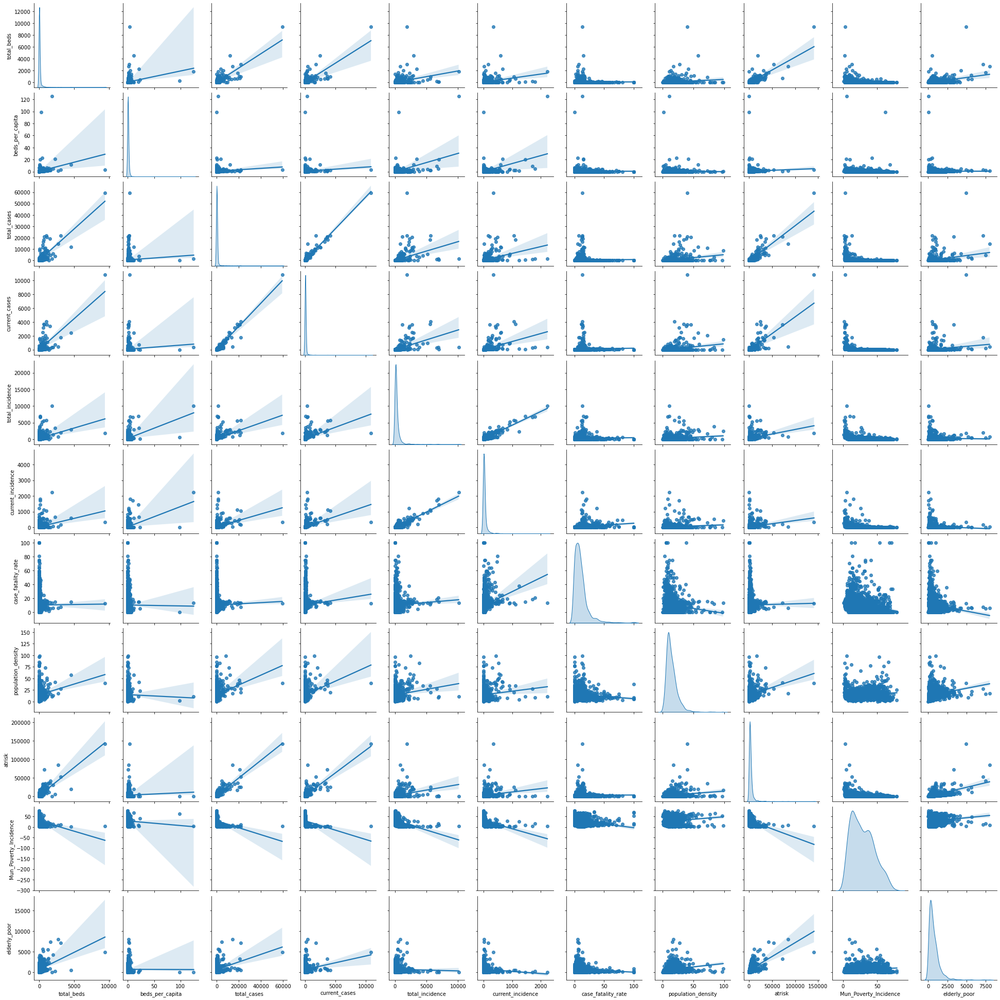

In [145]:
_ = sns.pairplot(spatial_ana[cluster_variables], kind='reg', diag_kind='kde')

### Local spatial autocorrelation

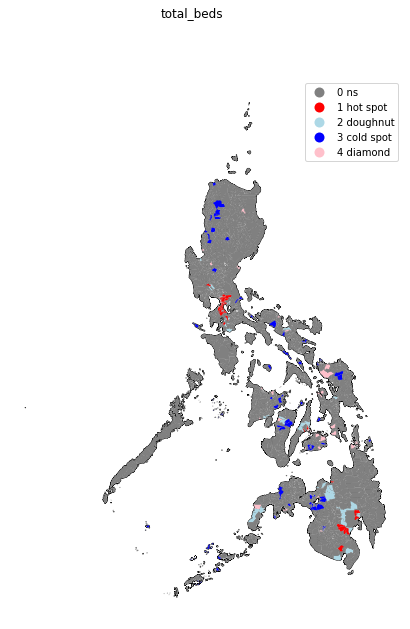

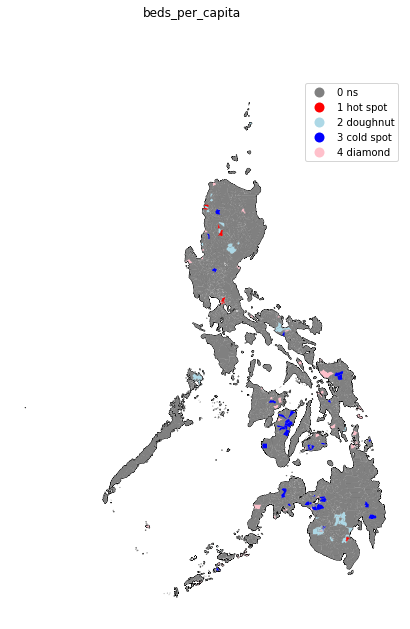

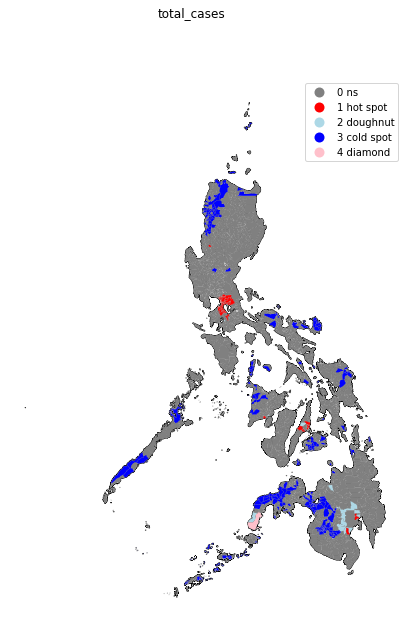

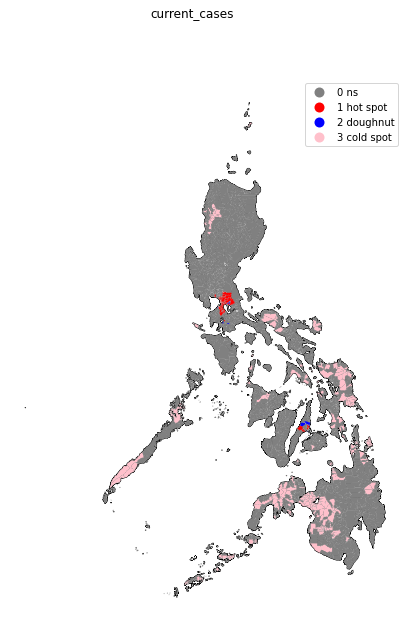

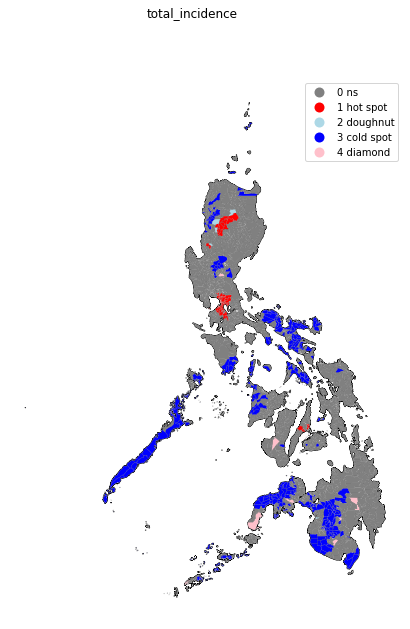

...

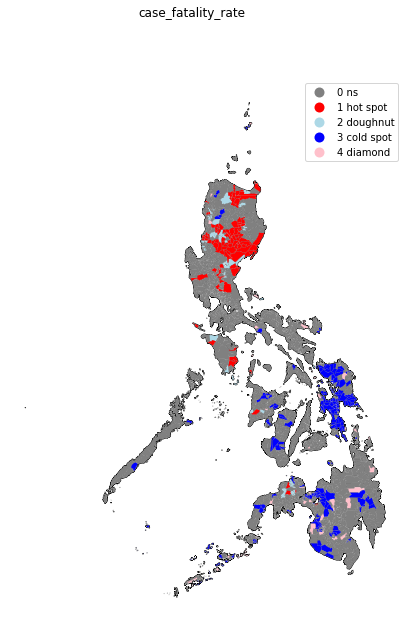

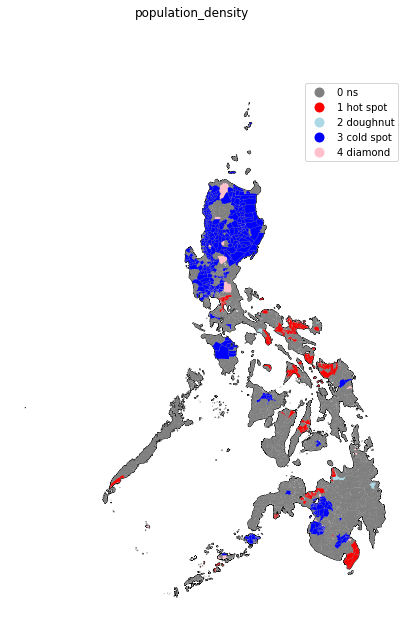

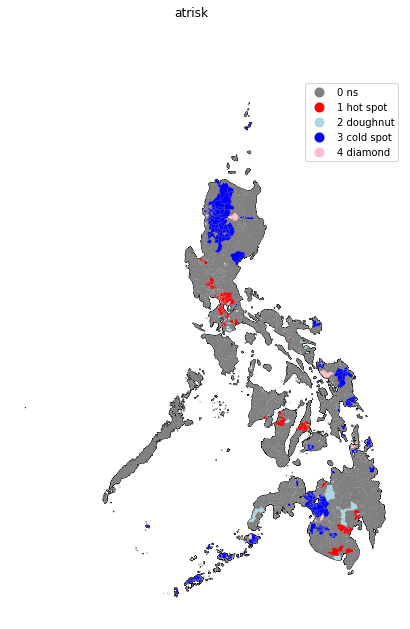

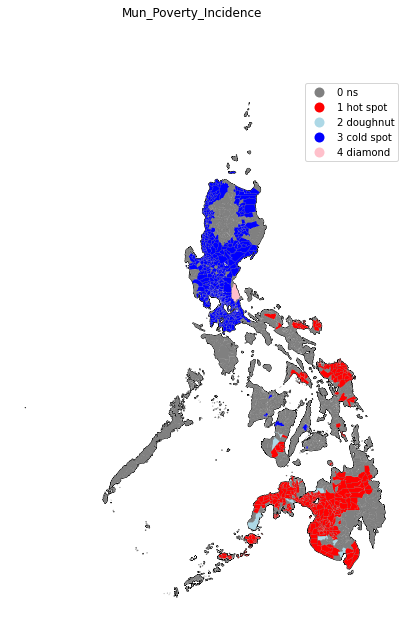

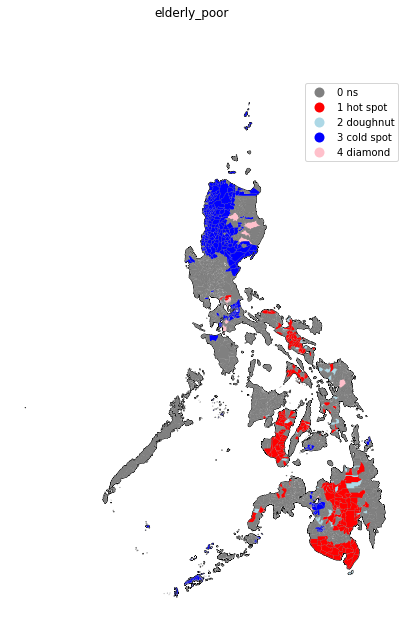

In [146]:
cluster_variables =  [
                     'total_beds', 
           'beds_per_capita',
           'total_cases',
           'current_cases', 
           'total_incidence',
           'current_incidence',
           'case_fatality_rate',
           'population_density',
           'atrisk', 
           'Mun_Poverty_Incidence',
           'elderly_poor'
]
for variable in cluster_variables:
    lisa = Moran_Local(spatial_ana[variable], wfixed)
    spatial_ana['Is'] = lisa.Is
   

    sig = 1 * (lisa.p_sim < 0.05)
   
    hotspot = 1 * (sig * lisa.q==1)
    coldspot = 3 * (sig * lisa.q==3)
    doughnut = 2 * (sig * lisa.q==2)
    diamond = 4 * (sig * lisa.q==4)
    spots = hotspot + coldspot + doughnut + diamond
    spot_labels = [ '0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
    labels = [spot_labels[i] for i in spots]
    hmap = ListedColormap([ 'grey', 'red', 'lightblue', 'blue', 'pink'])

    ax = final_df.plot(edgecolor='k', facecolor='w', figsize=(15, 10))
    spatial_ana.assign(cl=labels).plot(column='cl', categorical=True, \
            k=2, cmap=hmap, linewidth=0.1, ax=ax, \
            edgecolor='white', legend=True)


    ax.set_aspect('equal')
    ax.set_axis_off()


    # Display the figure
    plt.suptitle(variable)
    plt.show()

## Feature engineering

## Evaluator

In [147]:
#evaluator
def evaluator(df, variable):
    print(df['cluster_labels'].value_counts())
    # Index db on cluster ID
    analysis_df2 = df
    analysis_df2 = analysis_df2.set_index('cluster_labels')
    # Keep only variables used for clustering
    analysis_df2 = analysis_df2[variable]
    # Stack column names into a column, obtaining 
    # a "long" version of the dataset
    analysis_df2 = analysis_df2.stack()
    # Take indices into proper columns
    analysis_df2 = analysis_df2.reset_index()
    # Rename column names
    analysis_df2 = analysis_df2.rename(columns={
                                'level_1': 'Attribute', 
                               0: 'Values'})
    #Setup the facets
    facets = sns.FacetGrid(data=analysis_df2, col='Attribute', hue='cluster_labels', \
                          sharey=False, sharex=False, aspect=2, col_wrap=3)
    # Build the plot as a `sns.kdeplot`
    _ = facets.map(sns.kdeplot, 'Values', shade=True).add_legend()
    return
# mapping the clusters
def mapper(df):
    # Setup figure and ax
    f, ax = plt.subplots(1, figsize=(12, 12))
    # Plot unique values choropleth including a legend and with no boundary lines
    df.plot(column='cluster_labels', categorical=True, legend=True, linewidth=0, ax=ax, cmap='viridis')
    # Remove axis
    ax.set_axis_off()
    # Keep axes proportionate
    plt.axis('equal')
    # Add title
    plt.title('Map of the Clusters')
    # Display the map
    plt.show()
    return
# radial graph


## Veriable

In [454]:
variable =  [
    #'total_beds',
    'beds_per_capita', 
    #'beds_per_capita_lag', 
    #'total_cases',
    #'current_cases',
    'total_incidence', 
    'current_incidence', 
    #'current_incidence_lag', 
    #'case_fatality_rate', 
    'population_density', 
    'atrisk', 
    'Mun_Poverty_Incidence',
    #'elderly_poor'
]

## Clustering Kmeans

In [291]:
#scaler
from sklearn.preprocessing import StandardScaler
def stdScaler(df):
    scaler = StandardScaler()
    return scaler.fit_transform(df)

# elbow method
from sklearn.cluster import KMeans

def kMeansClustering(scaled_df):
    ssd = []
    range_n_clusters = list(np.arange(1,16))

    # running kmeans with different n
    for num_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=num_clusters, random_state=2) #random state para you can run it with other machines (reproducing the pagka-random nya)
        kmeans.fit(scaled_df)

        ssd.append(kmeans.inertia_)
    # inertia: sum of squared errors (where error = distance of centroid from a point)
    # kinukuha nya inertia for each value of k

    # plot the SSDs for each n_clusters
    plt.plot(ssd)

In [292]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
def getSilhouettes(scaled_df):
    range_n_clusters = list(np.arange(2,9))

    for num_clusters in range_n_clusters:

        # intialise kmeans
        kmeans = KMeans(n_clusters=num_clusters, random_state=2)
        kmeans.fit(scaled_df)

        cluster_labels = kmeans.predict(scaled_df)

        # silhouette score; how far they are apart
        silhouette_avg = silhouette_score(scaled_df, cluster_labels)
        print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

In [293]:
#to produce clusters
def produceClusters(n_clusters, scaled_df, random_state=2):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(scaled_df)
    return kmeans.predict(scaled_df)

For n_clusters=2, the silhouette score is 0.7868928833227724
For n_clusters=3, the silhouette score is 0.7632308099726065
For n_clusters=4, the silhouette score is 0.32424059174062975
For n_clusters=5, the silhouette score is 0.3057716395595072
For n_clusters=6, the silhouette score is 0.31241998310163566
For n_clusters=7, the silhouette score is 0.32167013098435
For n_clusters=8, the silhouette score is 0.3177269126910542


C:\Users\gear\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


For n_clusters=2, the silhouette score is 0.8164331513250543
For n_clusters=3, the silhouette score is 0.28386563248994084
For n_clusters=4, the silhouette score is 0.2874460245254844
For n_clusters=5, the silhouette score is 0.29956595732156244
For n_clusters=6, the silhouette score is 0.3014746208866767
For n_clusters=7, the silhouette score is 0.2908919198407666
For n_clusters=8, the silhouette score is 0.2986787036748589


C:\Users\gear\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
C:\Users\gear\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


For n_clusters=2, the silhouette score is 0.8746008683030008
For n_clusters=3, the silhouette score is 0.26875022536191273
For n_clusters=4, the silhouette score is 0.2732783285542658
For n_clusters=5, the silhouette score is 0.2549939962991096
For n_clusters=6, the silhouette score is 0.26531454762883777
For n_clusters=7, the silhouette score is 0.2644162359298167
For n_clusters=8, the silhouette score is 0.26971799338258007
(4) Low Prioritty but Low Resource    920
(3) Low Priority                      519
(2) 2nd Priority                      186
(1) 1st Priority                       22
Name: cluster_labels, dtype: int64


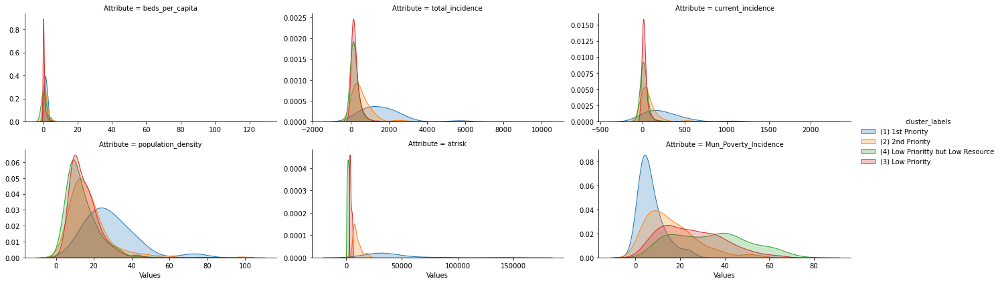

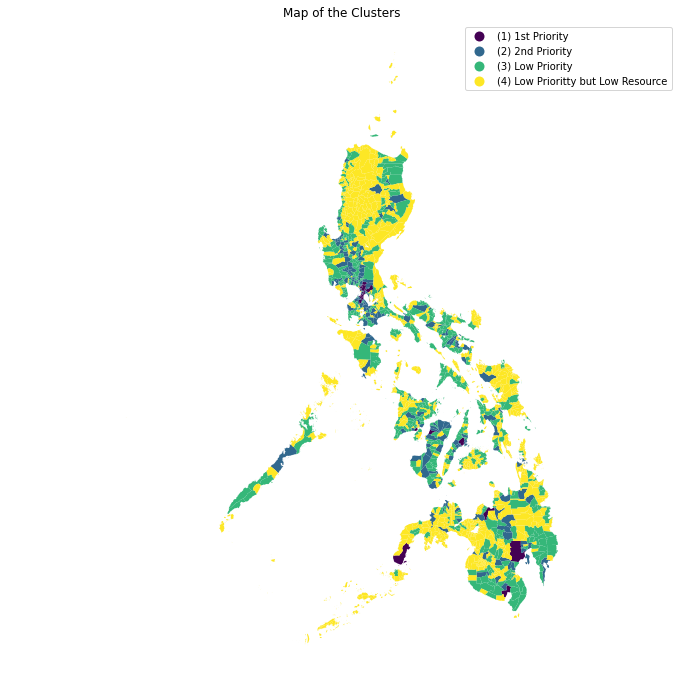

In [455]:

cluster2 = final_df.copy()
getSilhouettes(stdScaler(cluster2[variable]))
cluster2['cluster_labels'] = produceClusters(2, cluster2[variable])
table = cluster2.groupby(['cluster_labels'])['cluster_labels'].count()
if table[0]>table[1]:
    group1 = cluster2[cluster2['cluster_labels']==1]
    group1['cluster_labels'] = group1['cluster_labels'].replace(1, '(1) 1st Priority')
    other = cluster2[cluster2['cluster_labels']==0]
else:
    group1 = cluster2[cluster2['cluster_labels']==0]
    group1['cluster_labels'] = group1['cluster_labels'].replace(0, '(1) 1st Priority')
    other = cluster2[cluster2['cluster_labels']==1]
getSilhouettes(stdScaler(other[variable]))
other['cluster_labels'] = produceClusters(2, other[variable])
table = other.groupby(['cluster_labels'])['cluster_labels'].count()
if table[0]>table[1]:
    group2 = other[other['cluster_labels']==1]
    group2['cluster_labels'] = group2['cluster_labels'].replace(1, '(2) 2nd Priority')
    other = other[other['cluster_labels']==0]
else:
    group2 = other[other['cluster_labels']==0]
    group2['cluster_labels'] = group2['cluster_labels'].replace(0, '(2) 2nd Priority')
    other = other[other['cluster_labels']==1]
getSilhouettes(stdScaler(other[variable]))
other['cluster_labels'] = produceClusters(2, other[variable])
table = other.groupby(['cluster_labels'])['cluster_labels'].count()
if table[0]>table[1]:
    other['cluster_labels'] = other['cluster_labels'].replace(1, '(3) Low Priority')
    other['cluster_labels'] = other['cluster_labels'].replace(0, '(4) Low Prioritty but Low Resource')
else:
    other['cluster_labels'] = other['cluster_labels'].replace(0, '(3) Low Priority')
    other['cluster_labels'] = other['cluster_labels'].replace(1, '(4) Low Priority but Low Resource')
kmeans1 = pd.concat([group1, group2, other], ignore_index = True)
evaluator(kmeans1, variable)
mapper(kmeans1)

In [188]:
def without_hue(plot, feature):
    total = len(feature)
    for p in ax.patches:
        percentage  = '{:.1f}%'.format(100*p.get_height()/total)
        x = p.get_x() + p.get_width()/2-0.05
        y - p.get_y() + p.get_height()
        ax.annotate(percentage, (x,y), size = 12)
    plt.show()

In [189]:
plt.figure(figsize = (7,5))
ax = sns.countplot('cluster_labels', data = kmeans1)
plt.xticks(size = 12)
plt.xlabel('Clusters', size = 12)
plt.yticks(size = 12)
plt.ylabel('count', size = 12)
without_hue(ax, kmeans1.cluster_labels)

C:\Users\gear\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


TypeError: cannot convert the series to <class 'float'>

<Figure size 504x360 with 1 Axes>

Text(0.5, 0, 'No. of Municipalities')

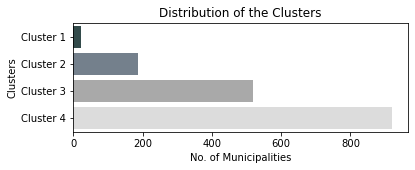

In [281]:
plt.figure(figsize = (6,2))
ax = sns.countplot(y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkslategray', 'slategrey', 'darkgrey', 'gainsboro'])
plt.title('Distribution of the Clusters')
plt.ylabel('Clusters')
plt.xlabel('No. of Municipalities')

In [153]:
c1 = kmeans1[kmeans1['cluster_labels']=='Cluster 1']
c2 = kmeans1[kmeans1['cluster_labels']=='Cluster 2']
c3 = kmeans1[kmeans1['cluster_labels']=='Cluster 3']
c4 = kmeans1[kmeans1['cluster_labels']=='Cluster 4']

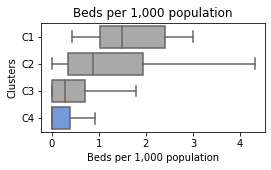

In [346]:
plt.figure(figsize = (4,2))
ax = sns.boxplot(x='beds_per_capita', y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkgrey', 'darkgrey', 'darkgrey', 'cornflowerblue'], showfliers = False)
plt.ylabel('Clusters')
plt.title('Beds per 1,000 population')
plt.xlabel('Beds per 1,000 population')
plt.yticks([0,1,2,3], labels = ['C1', 'C2', 'C3', 'C4'])
plt.tight_layout
plt.savefig('bed4.png')

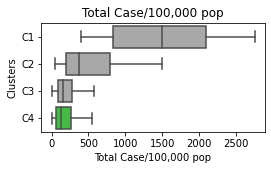

In [347]:
plt.figure(figsize = (4,2))
ax = sns.boxplot(x='total_incidence', y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkgrey', 'darkgrey', 'darkgrey', 'limegreen'], showfliers = False)
plt.ylabel('Clusters')
plt.title('Total Case/100,000 pop')
plt.xlabel('Total Case/100,000 pop')
plt.yticks([0,1,2,3], labels = ['C1', 'C2', 'C3', 'C4'])
plt.tight_layout
plt.savefig('tc4.png')

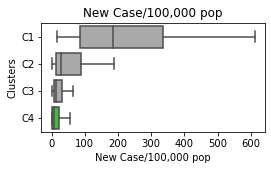

In [348]:
plt.figure(figsize = (4,2))
ax = sns.boxplot(x='current_incidence', y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkgrey', 'darkgrey', 'darkgrey', 'limegreen'], showfliers = False)
plt.ylabel('Clusters')
plt.title('New Case/100,000 pop')
plt.xlabel('New Case/100,000 pop')
plt.yticks([0,1,2,3], labels = ['C1', 'C2', 'C3', 'C4'])
plt.tight_layout
plt.savefig('nc4.png')

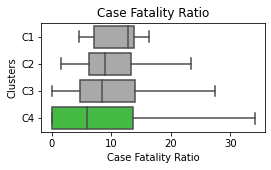

In [349]:
plt.figure(figsize = (4,2))
ax = sns.boxplot(x='case_fatality_rate', y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkgrey', 'darkgrey', 'darkgrey', 'limegreen'], showfliers = False)
plt.ylabel('Clusters')
plt.title('Case Fatality Ratio')
plt.xlabel('Case Fatality Ratio')
plt.yticks([0,1,2,3], labels = ['C1', 'C2', 'C3', 'C4'])
plt.tight_layout
plt.savefig('cf4.png')

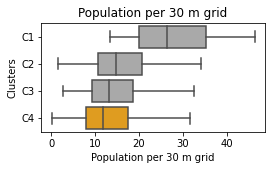

In [350]:
plt.figure(figsize = (4,2))
ax = sns.boxplot(x='population_density', y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkgrey', 'darkgrey', 'darkgrey', 'orange'], showfliers = False)
plt.ylabel('Clusters')
plt.title('Population per 30 m grid')
plt.xlabel('Population per 30 m grid')
plt.yticks([0,1,2,3], labels = ['C1', 'C2', 'C3', 'C4'])
plt.tight_layout
plt.savefig('pd4.png')

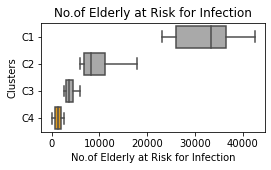

In [351]:
plt.figure(figsize = (4,2))
ax = sns.boxplot(x='atrisk', y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkgrey', 'darkgrey', 'darkgrey', 'orange'], showfliers = False)
plt.ylabel('Clusters')
plt.title('No.of Elderly at Risk for Infection')
plt.xlabel('No.of Elderly at Risk for Infection')
plt.yticks([0,1,2,3], labels = ['C1', 'C2', 'C3', 'C4'])
plt.tight_layout
plt.savefig('ar4.png')

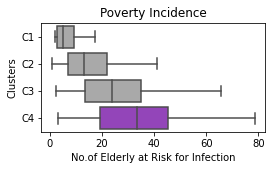

In [352]:
plt.figure(figsize = (4,2))
ax = sns.boxplot(x='Mun_Poverty_Incidence', y = 'cluster_labels', data = kmeans1, order = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'], 
                   orient = 'h', palette = ['darkgrey', 'darkgrey', 'darkgrey', 'darkorchid'], showfliers = False)
plt.ylabel('Clusters')
plt.title('Poverty Incidence')
plt.xlabel('No.of Elderly at Risk for Infection')
plt.yticks([0,1,2,3], labels = ['C1', 'C2', 'C3', 'C4'])
plt.tight_layout
plt.savefig('pi4.png')

In [447]:
variable =  [
    #'total_beds',
    'beds_per_capita', 
    #'beds_per_capita_lag', 
    #'total_cases',
    #'current_cases',
    'total_incidence', 
    'current_incidence', 
    #'current_incidence_lag', 
    #'case_fatality_rate', 
    'population_density', 
    'atrisk', 
    'Mun_Poverty_Incidence',
    #'elderly_poor'
]

In [162]:
cluster_reg = kmeans1.groupby(['Region', 'cluster_labels'])['municipality'].count().reset_index().sort_values(by='cluster_labels')

In [163]:
cluster_reg['Region']

22                       Region IV-A (CALABARZON)
37                   Region VII (Central Visayas)
33                    Region VI (Western Visayas)
48                       Region XI (Davao Region)
26                Region IX (Zamboanga Peninsula)
18                     Region III (Central Luzon)
52                      Region XII (SOCCSKSARGEN)
8                   National Capital Region (NCR)
44                   Region X (Northern Mindanao)
9                   National Capital Region (NCR)
27                Region IX (Zamboanga Peninsula)
2          Cordillera Administrative Region (CAR)
49                       Region XI (Davao Region)
34                    Region VI (Western Visayas)
23                       Region IV-A (CALABARZON)
45                   Region X (Northern Mindanao)
56                           Region XIII (Caraga)
5                                 MIMAROPA Region
19                     Region III (Central Luzon)
15                     Region II (Cagayan Valley)


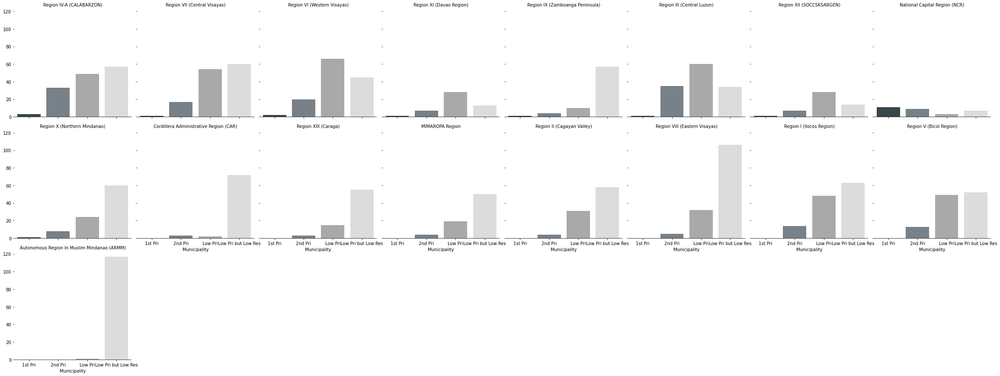

In [374]:
g = sns.catplot(y="municipality", x="cluster_labels", col="Region",
                data=cluster_reg, saturation=.5, row_order = ['Region I (Ilocos Region)',
                                                              'Cordillera Administrative Region (CAR)',
                                                              'Region II (Cagayan Valley)',
                                                              'Region III (Central Luzon)',
                                                              'National Capital Region (NCR)',
                                                              'Region IV-A (CALABARZON)',
                                                              'MIMAROPA Region',
                                                              'Region V (Bicol Region)',
                                                              'Region VI (Western Visayas)',
                                                              'Region VII (Central Visayas)',
                                                              'Region VIII (Eastern Visayas)',
                                                              'Region IX (Zamboanga Peninsula)',
                                                              'Region X (Northern Mindanao)',
                                                              'Region XI (Davao Region)',
                                                              'Region XII (SOCCSKSARGEN)',
                                                              'Region XIII (Caraga)',
                                                              'Autonomous Region In Muslim Mindanao (ARMM)'
                                                             ],
                kind="bar", ci=None, aspect=1, height = 4, orient = 'v', palette = ['darkslategray', 'slategrey', 'darkgrey', 'gainsboro'],
                col_wrap = 8
               )
(g.set_axis_labels("Municipality", "")
  .set_xticklabels(["1st Pri", "2nd Pri", "Low Pri", "Low Pri but Low Res"])
  .set_titles("{col_name}")
  #.set(ylim=(0, 1))
  .despine(left=True))
plt.savefig('regions.png')

In [432]:
regions = kmeans1[['RegCode', 'Region', 'geometry']]
regions = regions.dissolve(by='RegCode')
province = kmeans1[['ProvinceCo', 'Province', 'geometry']]
province = province.dissolve(by='ProvinceCo')

In [456]:
coordinate1 = province[province['Province']=='Zambales'].geometry.total_bounds
coordinate2 = regions[regions['Region']=='Cordillera Administrative Region (CAR)'].geometry.total_bounds
coordinate3 = regions[regions['Region']=='Region IV-A (CALABARZON)'].geometry.total_bounds

In [435]:
province['Province'].unique()

array(['Ilocos Norte', 'Ilocos Sur', 'La Union', 'Pangasinan', 'Batanes',
       'Cagayan', 'Isabela', 'Nueva Vizcaya', 'Quirino', 'Bataan',
       'Bulacan', 'Nueva Ecija', 'Pampanga', 'Tarlac', 'Zambales',
       'Aurora', 'Batangas', 'Cavite', 'Laguna', 'Quezon', 'Rizal',
       'Albay', 'Camarines Norte', 'Camarines Sur', 'Catanduanes',
       'Masbate', 'Sorsogon', 'Aklan', 'Antique', 'Capiz', 'Iloilo',
       'Negros Occidental', 'Guimaras', 'Bohol', 'Cebu',
       'Negros Oriental', 'Siquijor', 'Eastern Samar', 'Leyte',
       'Northern Samar', 'Samar', 'Southern Leyte', 'Biliran',
       'Zamboanga del Norte', 'Zamboanga del Sur', 'Zamboanga Sibugay',
       'City of Isabela (Not a Province)', 'Bukidnon', 'Camiguin',
       'Lanao del Norte', 'Misamis Occidental', 'Misamis Oriental',
       'Davao del Norte', 'Davao del Sur', 'Davao Oriental',
       'Davao de Oro', 'Davao Occidental', 'Cotabato', 'South Cotabato',
       'Sultan Kudarat', 'Sarangani', 'City of Cotabato (Not a 

In [401]:
coordinate2

array([13646533.03056674,  1003637.61047334, 13875459.63566349,
        1283085.45334785])

In [411]:
kmeans1['cluster_labels'].unique()

array(['1st Priority', '2nd Priority', 'Low Prioritty but Low Resource',
       'Low Priority'], dtype=object)

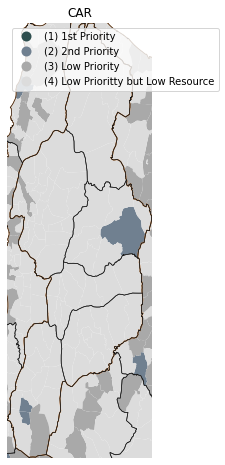

In [458]:
# Setup figure and ax
f, ax = plt.subplots(1, figsize=(8, 8))
# Plot unique values choropleth including a legend and with no boundary lines
kmeans1.plot(column='cluster_labels', categorical=True, legend=True, legend_kwds = {'loc' : 'upper left'}, linewidth=0, ax=ax, cmap=get_custom_color_palette())# ['1st Priority', '2nd Priority', 'Low Priority', 'Low Priority but Low Resource'])
regions.boundary.plot(ax=ax, linewidth = 0.9, edgecolor='sandybrown')
province.boundary.plot(ax=ax, linewidth = 0.65, edgecolor='0.1')
xlim = ([coordinate2[0], coordinate2[2]])
ylim = ([coordinate2[1], coordinate2[3]])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
# Remove axis
ax.set_axis_off()
# Keep axes proportionate
#plt.axis('equal')
# Add title
plt.title('CAR')
# Display the map
plt.savefig('CAR.png')
plt.show()

In [426]:
kmeans1[kmeans1['cluster_labels'] == '(3) Low Priority']

,Shape_Leng,Shape_Area,municipalcode,RegCode,Region,ProvinceCo,Province,municipality,Mun_Poverty_Incidence,total_beds,...,current_cases_lag,total_incidence_lag,current_incidence_lag,case_fatality_rate_lag,population_density_lag,atrisk_lag,Mun_Poverty_Incidence_lag,elderly_poor_lag,Is,cluster_labels
212,1.013649,0.026124,83701000,80000000,Region VIII (Eastern Visayas),83700000,Leyte,Abuyog,36.1,75.0,...,1.250000,201.572186,3.562237,2.254350,11.632500,1853.250000,38.025000,696.610750,-0.067973,(3) Low Priority
216,0.698457,0.014004,15501000,10000000,Region I (Ilocos Region),15500000,Pangasinan,Agno,16.6,0.0,...,3.666667,153.993517,22.899296,19.708995,5.973333,2549.666667,13.466667,335.619667,0.209283,(3) Low Priority
217,0.328783,0.004081,41001000,40000000,Region IV-A (CALABARZON),41000000,Batangas,Agoncillo,11.8,0.0,...,23.000000,358.479839,36.157738,10.923764,9.555000,3346.000000,13.600000,413.512500,0.257745,(3) Low Priority
218,0.303999,0.004071,13301000,10000000,Region I (Ilocos Region),13300000,La Union,Agoo,6.7,130.0,...,10.666667,139.928349,27.317326,22.902378,8.400000,2707.000000,8.233333,224.754667,0.384644,(3) Low Priority
219,0.620735,0.013317,15502000,10000000,Region I (Ilocos Region),15500000,Pangasinan,Aguilar,16.6,9.0,...,14.750000,143.031401,13.023694,10.020769,9.500000,6921.500000,16.350000,1043.505750,-0.158452,(3) Low Priority
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1635,0.435780,0.006824,15547000,10000000,Region I (Ilocos Region),15500000,Pangasinan,Villasis,10.2,10.0,...,16.428571,192.493394,17.783932,8.625538,9.861429,5175.857143,11.600000,591.231714,0.049393,(3) Low Priority
1639,0.980274,0.045381,12823000,10000000,Region I (Ilocos Region),12800000,Ilocos Norte,Vintar,8.5,0.0,...,5.400000,135.642592,24.457565,10.001347,9.893000,2010.000000,12.900000,186.682300,0.490863,(3) Low Priority
1640,1.881142,0.007883,51612000,50000000,Region V (Bicol Region),51600000,Camarines Norte,Vinzons,43.1,0.0,...,2.250000,54.824511,5.189396,9.424603,16.035000,3048.000000,33.725000,1098.413250,0.494201,(3) Low Priority
1641,0.551993,0.011227,52011000,50000000,Region V (Bicol Region),52000000,Catanduanes,Virac (Capital),26.7,160.0,...,2.000000,71.280174,6.144214,6.469136,25.370000,1924.000000,40.900000,790.926667,0.067641,(3) Low Priority


In [202]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
kminmax = scaler.fit_transform(kmeans1[variable])
kminmax = pd.DataFrame(kminmax, index = kmeans1.index,
                      columns = variable)
kminmax['cluster_labels'] = kmeans1['cluster_labels']
kminmax = kminmax.set_index('cluster_labels')
kminmax = kminmax.groupby('cluster_labels').mean().reset_index()
kminmax

,cluster_labels,beds_per_capita,total_incidence,current_incidence,case_fatality_rate,population_density,atrisk,Mun_Poverty_Incidence
0,Cluster 1,0.013816,0.162405,0.113379,0.109641,0.292123,0.290924,0.080509
1,Cluster 2,0.011649,0.060732,0.038490,0.100203,0.176507,0.068099,0.197695
2,Cluster 3,0.004647,0.024047,0.013580,0.105884,0.153228,0.027008,0.316490
3,Cluster 4,0.005333,0.024777,0.016407,0.102047,0.142219,0.009646,0.422489


In [452]:
from math import pi
def make_spider( row, title, color):
 
    # number of variable
    categories=list(kminmax)[1:]
    N = len(categories)
 
    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
 
    # Initialise the spider plot
    ax = plt.subplot(2,2,row+1, polar=True )
 
    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 3.5)
    ax.set_theta_direction(-1)
    
    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='steelblue', size=8)
 
    # Draw ylabels
    ax.set_rlabel_position(1)
#     plt.yticks([-2, -1, 0, 1, 2], [-2,-1, 0, 1, 2], color="grey", size=7) #for sscaled
#     plt.ylim(-2.5,2.5)
    plt.yticks([-0.25, 0, 0.125, 0.25, 0.325, 0.50], [-0.25, 0, 0.125, 0.25, 0.325, 0.50], color="grey", size=7) #formmscaled
    plt.ylim(-0.25,0.5)

    # Ind1
    values=kminmax.loc[row].drop('cluster_labels').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.8)
    #ax.set_facecolor('c')
 
    # Add a title
    plt.title(title, size=14, color=color, y=1.1)

In [243]:
def get_custom_color_palette():
    return ListedColormap(['darkslategray', 'slategrey', 'darkgrey', 'gainsboro'])

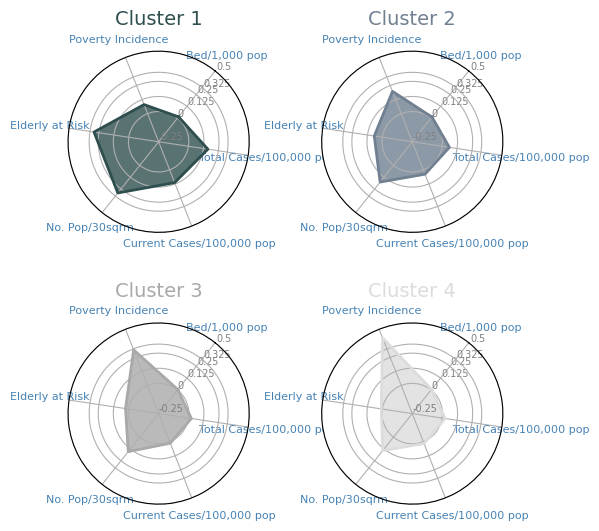

In [453]:
my_dpi=100
plt.figure(figsize=(600/my_dpi, 600/my_dpi), dpi=my_dpi)
plt.subplots_adjust(hspace=0.5)

# Create a color palette:

my_palette = plt.cm.get_cmap(get_custom_color_palette(), 4)

for row in range(0, len(kminmax.index)):
    make_spider(row=row, 
                title=(kminmax['cluster_labels'][row]), 
                color=my_palette(row))
plt.savefig('radar.png')

In [451]:
kminmax.columns

Index(['cluster_labels', 'Bed/1,000 pop', 'Total Cases/100,000 pop',
       'Current Cases/100,000 pop', 'No. Pop/30sqrm', 'Elderly at Risk',
       'Poverty Incidence'],
      dtype='object')

In [448]:
kminmax = kminmax.rename(columns = {'beds_per_capita': 'Bed/1,000 pop', 'total_incidence': 'Total Cases/100,000 pop',
                         'current_incidence': 'Current Cases/100,000 pop', 'case_fatality_rate': 'Case Fatality Ratio',
                         'population_density': 'No. Pop/30sqrm', 'atrisk': 'Elderly at Risk',
                         'Mun_Poverty_Incidence': 'Poverty Incidence'})

In [450]:
kminmax = kminmax.drop(['Case Fatality Ratio'], axis =1)

## Affinity Propagation

In [168]:
#to produce clusters
from sklearn.cluster import AffinityPropagation
def produceClustersAP(scaled_df, random_state=2):
    model = AffinityPropagation(damping=0.9, random_state=random_state)
    model.fit(scaled_df)
    return model.predict(scaled_df)

18    100
26     87
27     79
40     79
7      74
39     73
24     72
37     71
33     69
16     64
41     61
21     57
17     55
4      53
0      52
29     47
28     45
9      45
11     44
19     43
3      37
38     35
30     34
2      32
43     30
22     24
31     22
36     22
10     21
5      21
35     18
6      18
32     12
12     11
13     10
34      7
23      6
20      5
25      4
42      3
1       2
8       1
15      1
14      1
Name: cluster_labels, dtype: int64


C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.war

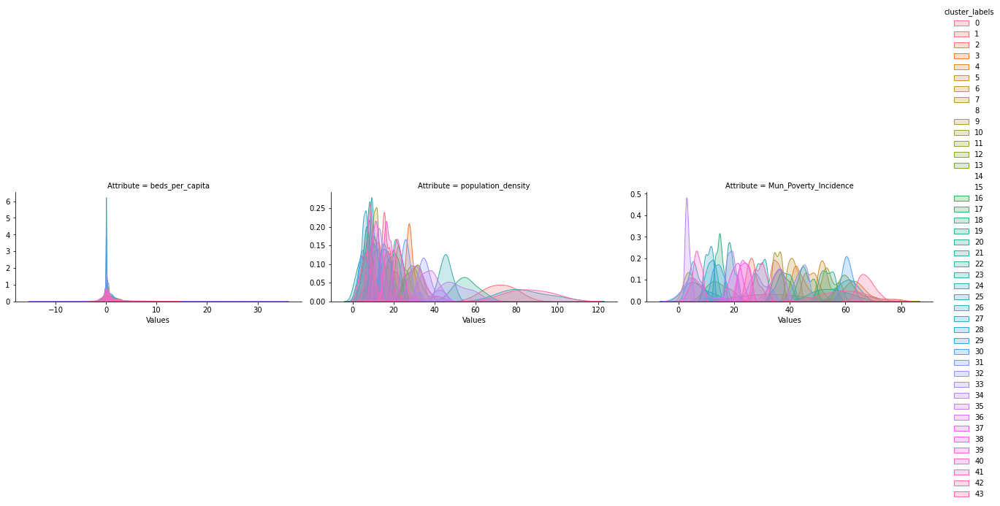

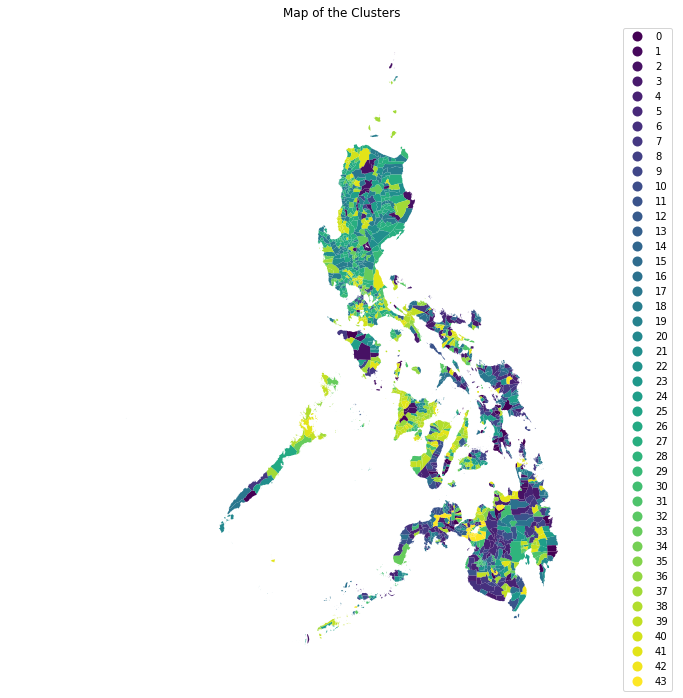

In [169]:
affinity_prop = final_df.copy()
affinity_prop['cluster_labels'] = produceClustersAP(affinity_prop[variable])
evaluator(affinity_prop, variable)
mapper(affinity_prop)

## Agglomerative Clustering

In [170]:
#to produce clusters
from sklearn.cluster import AgglomerativeClustering
def produceClustersAC(n_clusters, scaled_df, random_state=2):
    model = AgglomerativeClustering(n_clusters=n_clusters)
    return model.fit_predict(scaled_df)

0    651
3    481
1    476
2     39
Name: cluster_labels, dtype: int64


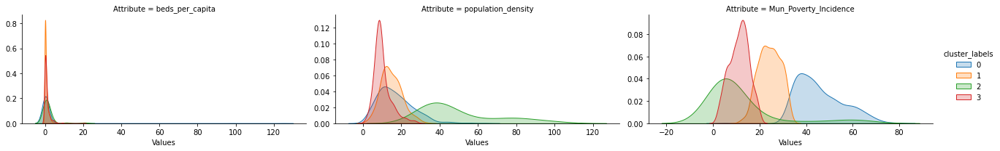

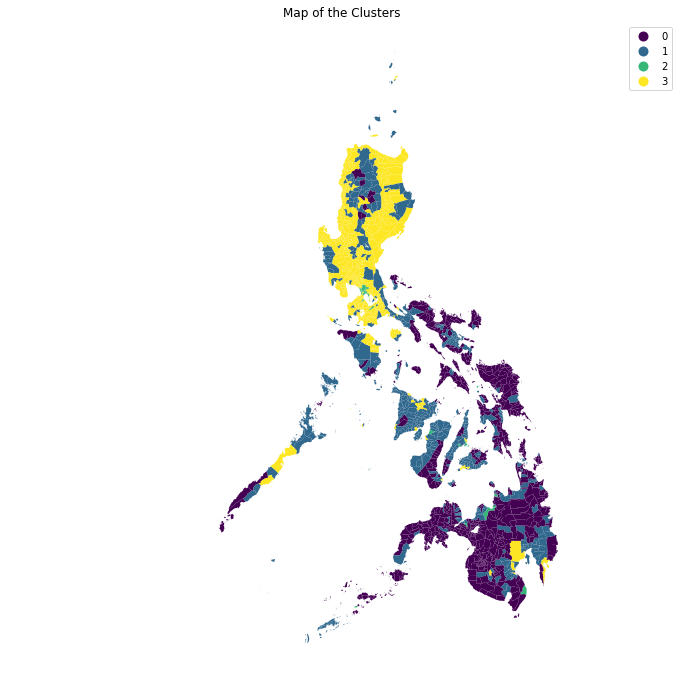

In [171]:
agglomerative = final_df.copy()
agglomerative['cluster_labels'] = produceClustersAC(4, agglomerative[variable])
evaluator(agglomerative, variable)
mapper(agglomerative)

## BIRCH

In [172]:
#to produce clusters
from sklearn.cluster import Birch
def produceClustersBirch(n_clusters, scaled_df):
    model = Birch(n_clusters=n_clusters, threshold = 0.01)
    model.fit(scaled_df)
    return model.predict(scaled_df)

0    651
3    481
1    476
2     39
Name: cluster_labels, dtype: int64


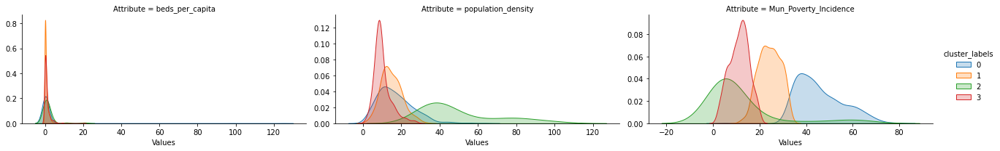

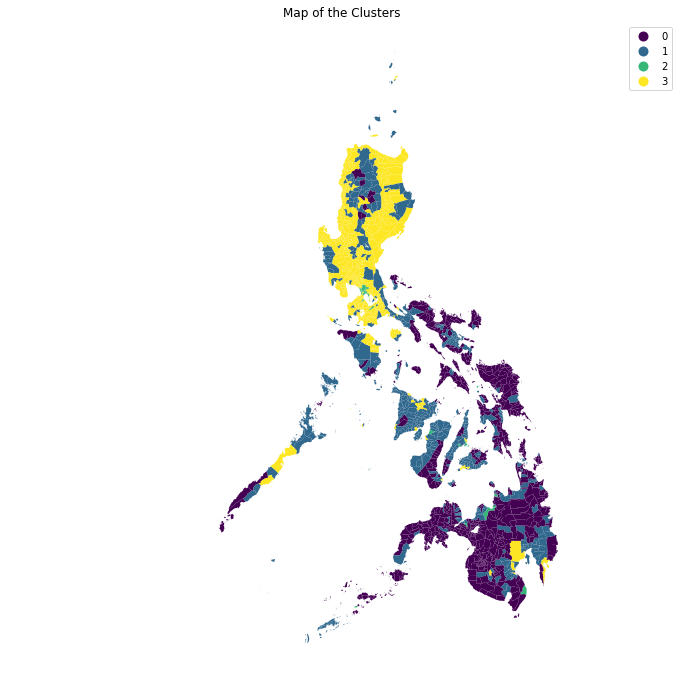

In [173]:
birch = final_df.copy()
birch['cluster_labels'] = produceClustersBirch(4, birch[variable])
evaluator(birch, variable)
mapper(birch)

## DBSCAN

In [174]:
#to produce clusters
from sklearn.cluster import DBSCAN
def produceClustersDbscan(scaled_df, random_state=2):
    model = DBSCAN(eps=0.15, min_samples = 4)
    return model.fit_predict(scaled_df)

-1    1647
Name: cluster_labels, dtype: int64


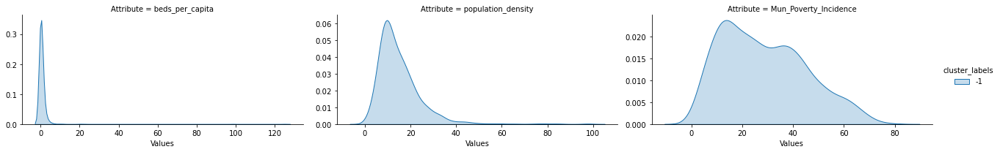

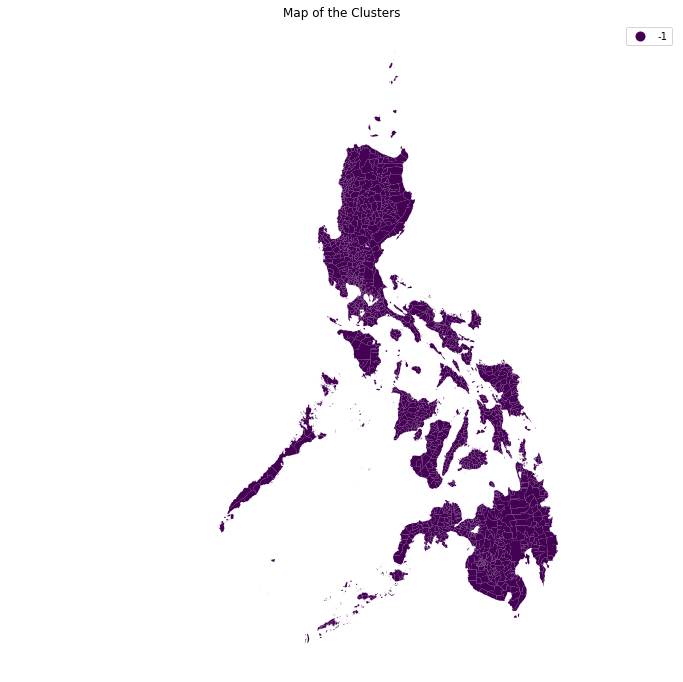

In [175]:
dbscan = final_df.copy()
dbscan['cluster_labels'] = produceClustersDbscan(dbscan[variable])
evaluator(dbscan, variable)
mapper(dbscan)

## Mean Shift

In [176]:
#to produce clusters
from sklearn.cluster import MeanShift
def produceClustersMS(scaled_df, random_state=2):
    model = MeanShift()
    return model.fit_predict(scaled_df)

0     1191
5      402
6       27
2       12
10       6
1        4
9        1
8        1
7        1
4        1
3        1
Name: cluster_labels, dtype: int64


C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.war

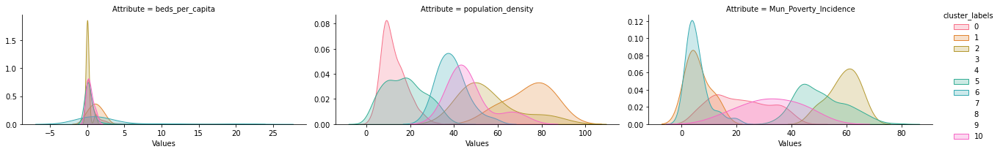

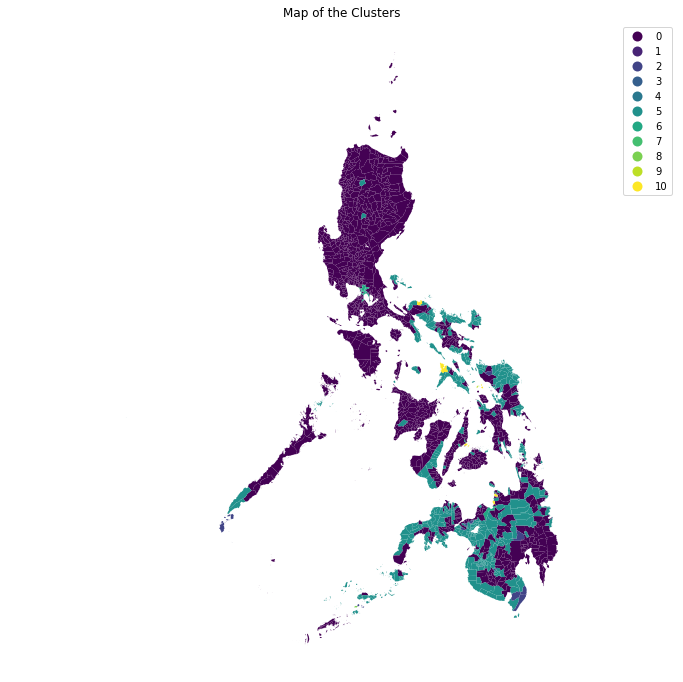

In [177]:
meanshift = final_df.copy()
meanshift['cluster_labels'] = produceClustersMS(meanshift[variable])
evaluator(meanshift, variable)
mapper(meanshift)

## Spectral Clustering

In [178]:
#to produce clusters
from sklearn.cluster import SpectralClustering
def produceClustersSC(n_clusters, scaled_df, random_state=2):
    model = SpectralClustering(n_clusters=n_clusters, random_state=random_state)
    return model.fit_predict(scaled_df)

C:\Users\gear\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
C:\Users\gear\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:296: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  est = KMeans(


2    1646
1       1
Name: cluster_labels, dtype: int64


C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


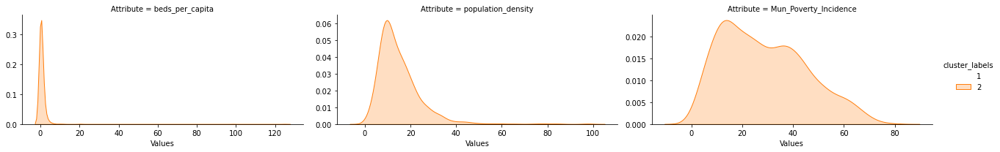

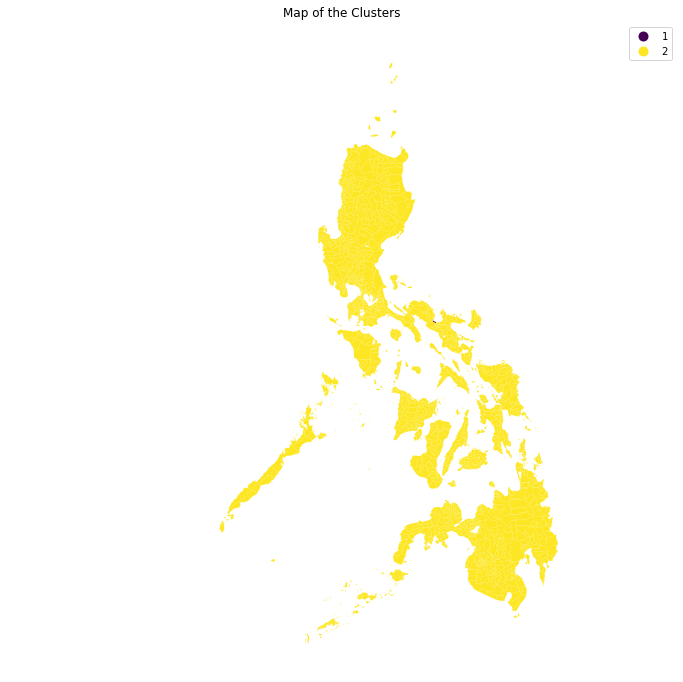

In [179]:
spectral = final_df.copy()
spectral['cluster_labels'] = produceClustersSC(4, spectral[variable])
evaluator(spectral, variable)
mapper(spectral)

## Gaussian Mixture Model

In [180]:
#to produce clusters
from sklearn.mixture import GaussianMixture
def produceClustersGM(n_components, scaled_df, random_state=2):
    model = GaussianMixture(n_components=n_components, random_state=random_state)
    model.fit(scaled_df)
    return model.predict(scaled_df)

2    820
0    552
3    257
1     18
Name: cluster_labels, dtype: int64


C:\Users\gear\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


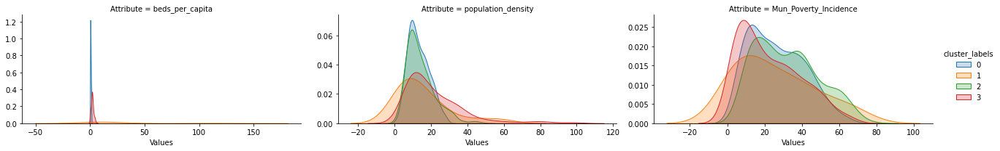

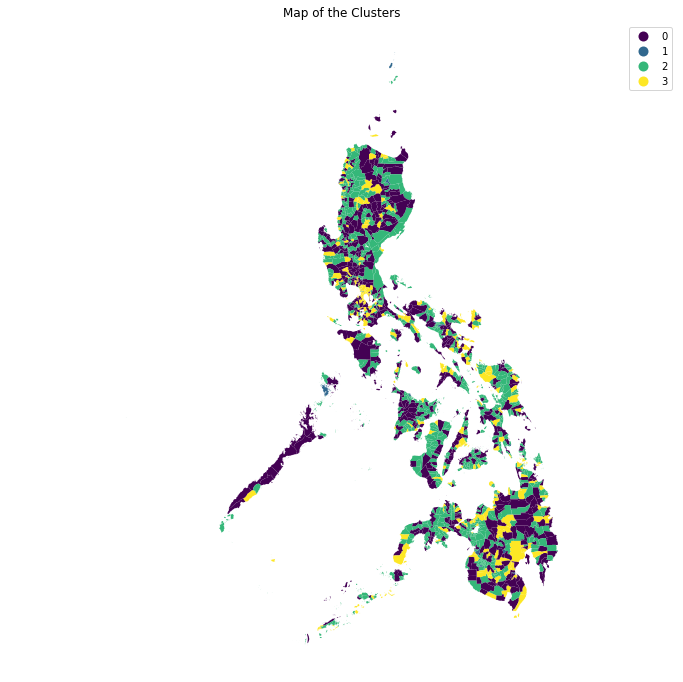

In [181]:
gaussian = final_df.copy()
gaussian['cluster_labels'] = produceClustersGM(4, gaussian[variable])
evaluator(gaussian, variable)
mapper(gaussian)